### Note
- This note book may take more time to run than usual because of manual feature elimination code for multiple linear regression.

### Importing all the required libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [2]:
import statsmodels.api as sm
import sklearn
from statsmodels.stats.outliers_influence import variance_inflation_factor

### Data Understanding/Data Cleaning

In [3]:
house_data = pd.read_csv("train.csv")
pd.set_option("display.max_columns",81)
print(house_data.shape)
house_data.head()

(1460, 81)


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
house_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [5]:
# checking the null values in each column
pd.set_option("display.max_rows",81)
house_data.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       259
LotArea             0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
MasVnrArea          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinSF1          0
BsmtFinType2       38
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
1stFlrSF            0
2ndFlrSF            0
LowQualFin

In [6]:
# checking the null values in each row
house_data.isnull().sum(axis=1)

0       5
1       4
2       4
3       4
4       4
       ..
1455    4
1456    3
1457    2
1458    5
1459    5
Length: 1460, dtype: int64

In [7]:
house_data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


### Data_dictionary

MSSubClass: Identifies the type of dwelling involved in the sale.	

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

MSZoning: Identifies the general zoning classification of the sale.
		
       A	Agriculture
       C	Commercial
       FV	Floating Village Residential
       I	Industrial
       RH	Residential High Density
       RL	Residential Low Density
       RP	Residential Low Density Park 
       RM	Residential Medium Density
	
LotFrontage: Linear feet of street connected to property

LotArea: Lot size in square feet

Street: Type of road access to property

       Grvl	Gravel	
       Pave	Paved
       	
Alley: Type of alley access to property

       Grvl	Gravel
       Pave	Paved
       NA 	No alley access
		
LotShape: General shape of property

       Reg	Regular	
       IR1	Slightly irregular
       IR2	Moderately Irregular
       IR3	Irregular
       
LandContour: Flatness of the property

       Lvl	Near Flat/Level	
       Bnk	Banked - Quick and significant rise from street grade to building
       HLS	Hillside - Significant slope from side to side
       Low	Depression
		
Utilities: Type of utilities available
		
       AllPub	All public Utilities (E,G,W,& S)	
       NoSewr	Electricity, Gas, and Water (Septic Tank)
       NoSeWa	Electricity and Gas Only
       ELO	Electricity only	
	
LotConfig: Lot configuration

       Inside	Inside lot
       Corner	Corner lot
       CulDSac	Cul-de-sac
       FR2	Frontage on 2 sides of property
       FR3	Frontage on 3 sides of property
	
LandSlope: Slope of property
		
       Gtl	Gentle slope
       Mod	Moderate Slope	
       Sev	Severe Slope
	
Neighborhood: Physical locations within Ames city limits

       Blmngtn	Bloomington Heights
       Blueste	Bluestem
       BrDale	Briardale
       BrkSide	Brookside
       ClearCr	Clear Creek
       CollgCr	College Creek
       Crawfor	Crawford
       Edwards	Edwards
       Gilbert	Gilbert
       IDOTRR	Iowa DOT and Rail Road
       MeadowV	Meadow Village
       Mitchel	Mitchell
       Names	North Ames
       NoRidge	Northridge
       NPkVill	Northpark Villa
       NridgHt	Northridge Heights
       NWAmes	Northwest Ames
       OldTown	Old Town
       SWISU	South & West of Iowa State University
       Sawyer	Sawyer
       SawyerW	Sawyer West
       Somerst	Somerset
       StoneBr	Stone Brook
       Timber	Timberland
       Veenker	Veenker
			
Condition1: Proximity to various conditions
	
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
Condition2: Proximity to various conditions (if more than one is present)
		
       Artery	Adjacent to arterial street
       Feedr	Adjacent to feeder street	
       Norm	Normal	
       RRNn	Within 200' of North-South Railroad
       RRAn	Adjacent to North-South Railroad
       PosN	Near positive off-site feature--park, greenbelt, etc.
       PosA	Adjacent to postive off-site feature
       RRNe	Within 200' of East-West Railroad
       RRAe	Adjacent to East-West Railroad
	
BldgType: Type of dwelling
		
       1Fam	Single-family Detached	
       2FmCon	Two-family Conversion; originally built as one-family dwelling
       Duplx	Duplex
       TwnhsE	Townhouse End Unit
       TwnhsI	Townhouse Inside Unit
	
HouseStyle: Style of dwelling
	
       1Story	One story
       1.5Fin	One and one-half story: 2nd level finished
       1.5Unf	One and one-half story: 2nd level unfinished
       2Story	Two story
       2.5Fin	Two and one-half story: 2nd level finished
       2.5Unf	Two and one-half story: 2nd level unfinished
       SFoyer	Split Foyer
       SLvl	Split Level
	
OverallQual: Rates the overall material and finish of the house

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average
       5	Average
       4	Below Average
       3	Fair
       2	Poor
       1	Very Poor
	
OverallCond: Rates the overall condition of the house

       10	Very Excellent
       9	Excellent
       8	Very Good
       7	Good
       6	Above Average	
       5	Average
       4	Below Average	
       3	Fair
       2	Poor
       1	Very Poor
		
YearBuilt: Original construction date

YearRemodAdd: Remodel date (same as construction date if no remodeling or additions)

RoofStyle: Type of roof

       Flat	Flat
       Gable	Gable
       Gambrel	Gabrel (Barn)
       Hip	Hip
       Mansard	Mansard
       Shed	Shed
		
RoofMatl: Roof material

       ClyTile	Clay or Tile
       CompShg	Standard (Composite) Shingle
       Membran	Membrane
       Metal	Metal
       Roll	Roll
       Tar&Grv	Gravel & Tar
       WdShake	Wood Shakes
       WdShngl	Wood Shingles
		
Exterior1st: Exterior covering on house

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast	
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
Exterior2nd: Exterior covering on house (if more than one material)

       AsbShng	Asbestos Shingles
       AsphShn	Asphalt Shingles
       BrkComm	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       CemntBd	Cement Board
       HdBoard	Hard Board
       ImStucc	Imitation Stucco
       MetalSd	Metal Siding
       Other	Other
       Plywood	Plywood
       PreCast	PreCast
       Stone	Stone
       Stucco	Stucco
       VinylSd	Vinyl Siding
       Wd Sdng	Wood Siding
       WdShing	Wood Shingles
	
MasVnrType: Masonry veneer type

       BrkCmn	Brick Common
       BrkFace	Brick Face
       CBlock	Cinder Block
       None	None
       Stone	Stone
	
MasVnrArea: Masonry veneer area in square feet

ExterQual: Evaluates the quality of the material on the exterior 
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
ExterCond: Evaluates the present condition of the material on the exterior
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
Foundation: Type of foundation
		
       BrkTil	Brick & Tile
       CBlock	Cinder Block
       PConc	Poured Contrete	
       Slab	Slab
       Stone	Stone
       Wood	Wood
		
BsmtQual: Evaluates the height of the basement

       Ex	Excellent (100+ inches)	
       Gd	Good (90-99 inches)
       TA	Typical (80-89 inches)
       Fa	Fair (70-79 inches)
       Po	Poor (<70 inches
       NA	No Basement
		
BsmtCond: Evaluates the general condition of the basement

       Ex	Excellent
       Gd	Good
       TA	Typical - slight dampness allowed
       Fa	Fair - dampness or some cracking or settling
       Po	Poor - Severe cracking, settling, or wetness
       NA	No Basement
	
BsmtExposure: Refers to walkout or garden level walls

       Gd	Good Exposure
       Av	Average Exposure (split levels or foyers typically score average or above)	
       Mn	Mimimum Exposure
       No	No Exposure
       NA	No Basement
	
BsmtFinType1: Rating of basement finished area

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement
		
BsmtFinSF1: Type 1 finished square feet

BsmtFinType2: Rating of basement finished area (if multiple types)

       GLQ	Good Living Quarters
       ALQ	Average Living Quarters
       BLQ	Below Average Living Quarters	
       Rec	Average Rec Room
       LwQ	Low Quality
       Unf	Unfinshed
       NA	No Basement

BsmtFinSF2: Type 2 finished square feet

BsmtUnfSF: Unfinished square feet of basement area

TotalBsmtSF: Total square feet of basement area

Heating: Type of heating
		
       Floor	Floor Furnace
       GasA	Gas forced warm air furnace
       GasW	Gas hot water or steam heat
       Grav	Gravity furnace	
       OthW	Hot water or steam heat other than gas
       Wall	Wall furnace
		
HeatingQC: Heating quality and condition

       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       Po	Poor
		
CentralAir: Central air conditioning

       N	No
       Y	Yes
		
Electrical: Electrical system

       SBrkr	Standard Circuit Breakers & Romex
       FuseA	Fuse Box over 60 AMP and all Romex wiring (Average)	
       FuseF	60 AMP Fuse Box and mostly Romex wiring (Fair)
       FuseP	60 AMP Fuse Box and mostly knob & tube wiring (poor)
       Mix	Mixed
		
1stFlrSF: First Floor square feet
 
2ndFlrSF: Second floor square feet

LowQualFinSF: Low quality finished square feet (all floors)

GrLivArea: Above grade (ground) living area square feet

BsmtFullBath: Basement full bathrooms

BsmtHalfBath: Basement half bathrooms

FullBath: Full bathrooms above grade

HalfBath: Half baths above grade

Bedroom: Bedrooms above grade (does NOT include basement bedrooms)

Kitchen: Kitchens above grade

KitchenQual: Kitchen quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       	
TotRmsAbvGrd: Total rooms above grade (does not include bathrooms)

Functional: Home functionality (Assume typical unless deductions are warranted)

       Typ	Typical Functionality
       Min1	Minor Deductions 1
       Min2	Minor Deductions 2
       Mod	Moderate Deductions
       Maj1	Major Deductions 1
       Maj2	Major Deductions 2
       Sev	Severely Damaged
       Sal	Salvage only
		
Fireplaces: Number of fireplaces

FireplaceQu: Fireplace quality

       Ex	Excellent - Exceptional Masonry Fireplace
       Gd	Good - Masonry Fireplace in main level
       TA	Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
       Fa	Fair - Prefabricated Fireplace in basement
       Po	Poor - Ben Franklin Stove
       NA	No Fireplace
		
GarageType: Garage location
		
       2Types	More than one type of garage
       Attchd	Attached to home
       Basment	Basement Garage
       BuiltIn	Built-In (Garage part of house - typically has room above garage)
       CarPort	Car Port
       Detchd	Detached from home
       NA	No Garage
		
GarageYrBlt: Year garage was built
		
GarageFinish: Interior finish of the garage

       Fin	Finished
       RFn	Rough Finished	
       Unf	Unfinished
       NA	No Garage
		
GarageCars: Size of garage in car capacity

GarageArea: Size of garage in square feet

GarageQual: Garage quality

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
GarageCond: Garage condition

       Ex	Excellent
       Gd	Good
       TA	Typical/Average
       Fa	Fair
       Po	Poor
       NA	No Garage
		
PavedDrive: Paved driveway

       Y	Paved 
       P	Partial Pavement
       N	Dirt/Gravel
		
WoodDeckSF: Wood deck area in square feet

OpenPorchSF: Open porch area in square feet

EnclosedPorch: Enclosed porch area in square feet

3SsnPorch: Three season porch area in square feet

ScreenPorch: Screen porch area in square feet

PoolArea: Pool area in square feet

PoolQC: Pool quality
		
       Ex	Excellent
       Gd	Good
       TA	Average/Typical
       Fa	Fair
       NA	No Pool
		
Fence: Fence quality
		
       GdPrv	Good Privacy
       MnPrv	Minimum Privacy
       GdWo	Good Wood
       MnWw	Minimum Wood/Wire
       NA	No Fence
	
MiscFeature: Miscellaneous feature not covered in other categories
		
       Elev	Elevator
       Gar2	2nd Garage (if not described in garage section)
       Othr	Other
       Shed	Shed (over 100 SF)
       TenC	Tennis Court
       NA	None
		
MiscVal: $Value of miscellaneous feature

MoSold: Month Sold (MM)

YrSold: Year Sold (YYYY)

SaleType: Type of sale
		
       WD 	Warranty Deed - Conventional
       CWD	Warranty Deed - Cash
       VWD	Warranty Deed - VA Loan
       New	Home just constructed and sold
       COD	Court Officer Deed/Estate
       Con	Contract 15% Down payment regular terms
       ConLw	Contract Low Down payment and low interest
       ConLI	Contract Low Interest
       ConLD	Contract Low Down
       Oth	Other
		
SaleCondition: Condition of sale

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)

In [8]:
# We can drop "ID" column
house_data_clean = house_data.drop("Id",axis=1)

In [9]:
print(house_data_clean.shape)
house_data_clean.head()

(1460, 80)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [10]:
# Extracting all the attributes with null values in it.
nullval_columns = []
for i in house_data.columns:
    if house_data[i].isnull().sum()!=0:
        nullval_columns.append(i)        
print("Below are the variables that has null values")
nullval_columns    

Below are the variables that has null values


['LotFrontage',
 'Alley',
 'MasVnrType',
 'MasVnrArea',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Electrical',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PoolQC',
 'Fence',
 'MiscFeature']

In [11]:
house_data[nullval_columns].head()

,LotFrontage,Alley,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Electrical,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MiscFeature
0,65.0,NaN,BrkFace,196.0,Gd,TA,No,GLQ,Unf,SBrkr,NaN,Attchd,2003.0,RFn,TA,TA,NaN,NaN,NaN
1,80.0,NaN,None,0.0,Gd,TA,Gd,ALQ,Unf,SBrkr,TA,Attchd,1976.0,RFn,TA,TA,NaN,NaN,NaN
2,68.0,NaN,BrkFace,162.0,Gd,TA,Mn,GLQ,Unf,SBrkr,TA,Attchd,2001.0,RFn,TA,TA,NaN,NaN,NaN
3,60.0,NaN,None,0.0,TA,Gd,No,ALQ,Unf,SBrkr,Gd,Detchd,1998.0,Unf,TA,TA,NaN,NaN,NaN
4,84.0,NaN,BrkFace,350.0,Gd,TA,Av,GLQ,Unf,SBrkr,TA,Attchd,2000.0,RFn,TA,TA,NaN,NaN,NaN


In [12]:
house_data[nullval_columns].isnull().sum()

LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

In [13]:
# calculating the percentage of null values
NA_percentage=pd.DataFrame((round(house_data[nullval_columns].isnull().sum()/(house_data[nullval_columns].count() + house_data[nullval_columns].isnull().sum()),3))*100)
NA_percentage = NA_percentage.reset_index()
NA_percentage = NA_percentage.rename(columns = {"index":"attributes",0:"NA_percentage"})
NA_percentage = NA_percentage.sort_values(by= "NA_percentage",ascending=False)
NA_percentage

,attributes,NA_percentage
16,PoolQC,99.5
18,MiscFeature,96.3
1,Alley,93.8
17,Fence,80.8
10,FireplaceQu,47.3
0,LotFrontage,17.7
11,GarageType,5.5
12,GarageYrBlt,5.5
13,GarageFinish,5.5
14,GarageQual,5.5


In [14]:
# As per data dictionary we observed that for most of the categorical variables "nan" has a specific meaning and are not null values.
# Treating categorical variables in nullval_columns
# unique values of the categorical variables before imputing
print("unique values of the categorical variables before imputing\n")
for i in house_data[nullval_columns]:
    if house_data[i].dtype == "O":
        print(house_data[i].unique(), f"= Unique values in {i}")

unique values of the categorical variables before imputing

[nan 'Grvl' 'Pave'] = Unique values in Alley
['BrkFace' 'None' 'Stone' 'BrkCmn' nan] = Unique values in MasVnrType
['Gd' 'TA' 'Ex' nan 'Fa'] = Unique values in BsmtQual
['TA' 'Gd' nan 'Fa' 'Po'] = Unique values in BsmtCond
['No' 'Gd' 'Mn' 'Av' nan] = Unique values in BsmtExposure
['GLQ' 'ALQ' 'Unf' 'Rec' 'BLQ' nan 'LwQ'] = Unique values in BsmtFinType1
['Unf' 'BLQ' nan 'ALQ' 'Rec' 'LwQ' 'GLQ'] = Unique values in BsmtFinType2
['SBrkr' 'FuseF' 'FuseA' 'FuseP' 'Mix' nan] = Unique values in Electrical
[nan 'TA' 'Gd' 'Fa' 'Ex' 'Po'] = Unique values in FireplaceQu
['Attchd' 'Detchd' 'BuiltIn' 'CarPort' nan 'Basment' '2Types'] = Unique values in GarageType
['RFn' 'Unf' 'Fin' nan] = Unique values in GarageFinish
['TA' 'Fa' 'Gd' nan 'Ex' 'Po'] = Unique values in GarageQual
['TA' 'Fa' nan 'Gd' 'Po' 'Ex'] = Unique values in GarageCond
[nan 'Ex' 'Fa' 'Gd'] = Unique values in PoolQC
[nan 'MnPrv' 'GdWo' 'GdPrv' 'MnWw'] = Unique values in Fe

In [15]:
# As per data dictionary "nan" has a specific meaning and are not null values.
categorical_columns_nullval_columns = []
data_dict = {'Alley':'No_alley_access',
             'BsmtQual':'No_Basement',
             'BsmtCond':'No_Basement',
             'BsmtExposure':'No_Basement',
             'BsmtFinType1':'No_Basement',
             'BsmtFinType2':'No_Basement',
             'FireplaceQu':'No_Fireplace',
             'GarageType':'No_Garage',
             'GarageFinish':'No_Garage',
             'GarageQual':'No_Garage',
             'GarageCond':'No_Garage',
             'PoolQC':'No_Pool',
             'Fence':'No_Fence',
             'MiscFeature':'None'}

# imputing the "nan" with respective value in data dictionary
# we are not imputing any value for variables "MasVnrType" and "Electrical" as their null values are missing data as per data dictionary
for i in house_data[nullval_columns]:
    if house_data[i].dtype == "O":
        categorical_columns_nullval_columns.append(i)
        if i in data_dict:
            house_data_clean[i] = house_data[i].fillna(data_dict[i])
            
# unique values of the categorical variables after imputing
print("unique values of the categorical variables after imputing\n")
for i in house_data_clean[nullval_columns]:
    if house_data_clean[i].dtype == "O":
        print(house_data_clean[i].unique(), f"= Unique values in {i}")

house_data_clean[categorical_columns_nullval_columns].head()

unique values of the categorical variables after imputing

['No_alley_access' 'Grvl' 'Pave'] = Unique values in Alley
['BrkFace' 'None' 'Stone' 'BrkCmn' nan] = Unique values in MasVnrType
['Gd' 'TA' 'Ex' 'No_Basement' 'Fa'] = Unique values in BsmtQual
['TA' 'Gd' 'No_Basement' 'Fa' 'Po'] = Unique values in BsmtCond
['No' 'Gd' 'Mn' 'Av' 'No_Basement'] = Unique values in BsmtExposure
['GLQ' 'ALQ' 'Unf' 'Rec' 'BLQ' 'No_Basement' 'LwQ'] = Unique values in BsmtFinType1
['Unf' 'BLQ' 'No_Basement' 'ALQ' 'Rec' 'LwQ' 'GLQ'] = Unique values in BsmtFinType2
['SBrkr' 'FuseF' 'FuseA' 'FuseP' 'Mix' nan] = Unique values in Electrical
['No_Fireplace' 'TA' 'Gd' 'Fa' 'Ex' 'Po'] = Unique values in FireplaceQu
['Attchd' 'Detchd' 'BuiltIn' 'CarPort' 'No_Garage' 'Basment' '2Types'] = Unique values in GarageType
['RFn' 'Unf' 'Fin' 'No_Garage'] = Unique values in GarageFinish
['TA' 'Fa' 'Gd' 'No_Garage' 'Ex' 'Po'] = Unique values in GarageQual
['TA' 'Fa' 'No_Garage' 'Gd' 'Po' 'Ex'] = Unique values in GarageCon

,Alley,MasVnrType,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Electrical,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PoolQC,Fence,MiscFeature
0,No_alley_access,BrkFace,Gd,TA,No,GLQ,Unf,SBrkr,No_Fireplace,Attchd,RFn,TA,TA,No_Pool,No_Fence,None
1,No_alley_access,None,Gd,TA,Gd,ALQ,Unf,SBrkr,TA,Attchd,RFn,TA,TA,No_Pool,No_Fence,None
2,No_alley_access,BrkFace,Gd,TA,Mn,GLQ,Unf,SBrkr,TA,Attchd,RFn,TA,TA,No_Pool,No_Fence,None
3,No_alley_access,None,TA,Gd,No,ALQ,Unf,SBrkr,Gd,Detchd,Unf,TA,TA,No_Pool,No_Fence,None
4,No_alley_access,BrkFace,Gd,TA,Av,GLQ,Unf,SBrkr,TA,Attchd,RFn,TA,TA,No_Pool,No_Fence,None


In [16]:
print(house_data_clean.shape)
house_data_clean.head()

(1460, 80)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,No_alley_access,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No_Fireplace,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No_Pool,No_Fence,None,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,No_alley_access,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No_Pool,No_Fence,None,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,No_alley_access,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No_Pool,No_Fence,None,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,No_alley_access,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No_Pool,No_Fence,None,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,No_alley_access,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No_Pool,No_Fence,None,0,12,2008,WD,Normal,250000


In [17]:
# Here we can remove missing values in "MasVnrType" and "Electrical" as the no.of missing value percentage is very less
# i.e., less than 1%
house_data_clean[categorical_columns_nullval_columns].isnull().sum()

Alley           0
MasVnrType      8
BsmtQual        0
BsmtCond        0
BsmtExposure    0
BsmtFinType1    0
BsmtFinType2    0
Electrical      1
FireplaceQu     0
GarageType      0
GarageFinish    0
GarageQual      0
GarageCond      0
PoolQC          0
Fence           0
MiscFeature     0
dtype: int64

In [18]:
house_data_clean = house_data_clean.dropna(subset=["MasVnrType","Electrical"])
print(house_data_clean.shape)
house_data_clean.head()

(1451, 80)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,No_alley_access,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No_Fireplace,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No_Pool,No_Fence,None,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,No_alley_access,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No_Pool,No_Fence,None,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,No_alley_access,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No_Pool,No_Fence,None,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,No_alley_access,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No_Pool,No_Fence,None,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,No_alley_access,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No_Pool,No_Fence,None,0,12,2008,WD,Normal,250000


In [19]:
# Treating numerical variables in nullval_columns
numerical_variables_nullval_columns = []
for i in house_data_clean[nullval_columns]:
    if house_data_clean[i].dtype !="O":
        numerical_variables_nullval_columns.append(i)
numerical_variables_nullval_columns

['LotFrontage', 'MasVnrArea', 'GarageYrBlt']

In [20]:
# Treating numerical variables LotFrontage
house_data_clean[numerical_variables_nullval_columns].isnull().sum()

LotFrontage    257
MasVnrArea       0
GarageYrBlt     81
dtype: int64

In [21]:
house_data_clean.LotFrontage.describe()

count    1194.000000
mean       70.027638
std        24.299302
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64

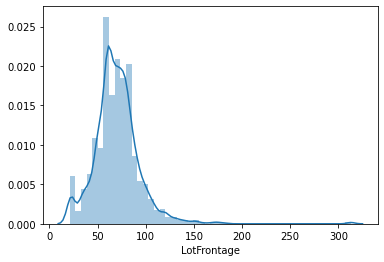

In [22]:
sns.distplot(house_data_clean.LotFrontage)

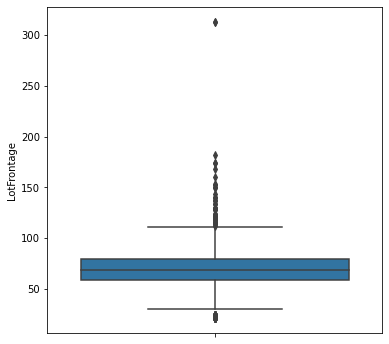

In [23]:
plt.figure(figsize=(6,6))
sns.boxplot(house_data_clean.LotFrontage,orient="v")

In [24]:
# imputing null values in LotFrontage with medianas there are outliers(natural outliers)
house_data_clean.LotFrontage = house_data.LotFrontage.fillna(house_data.LotFrontage.median())
house_data_clean.LotFrontage.isnull().sum()

0

In [25]:
# Treating numerical variables GarageYrBlt 
house_data_clean.GarageYrBlt.describe()

count    1370.000000
mean     1978.353285
std        24.685798
min      1900.000000
25%      1961.000000
50%      1979.500000
75%      2002.000000
max      2010.000000
Name: GarageYrBlt, dtype: float64

In [26]:
# Here GarageYrBlt is a categorical variable even though dtype for GarageYrBlt is not object.
# As it is a categorical variable we can either impute it with mode values or if null value percentage is less we can also opt to
# remove the missing values.
# But if we observe closely removing missing values will effect other categorical variables like (GarageType,GarageYrBlt,
# ,GarageFinish,GarageQual,GarageCond) i.e., by doing so we will be lossing one sublevel(no garage) in all the categorical variables
# Imputing the null values with 0 which means "No_Garage_Built"
house_data_clean.GarageYrBlt.unique()

array([2003., 1976., 2001., 1998., 2000., 1993., 2004., 1973., 1931.,
       1939., 1965., 2005., 1962., 2006., 1960., 1991., 1970., 1967.,
       1958., 1930., 2002., 1968., 2007., 2008., 1957., 1920., 1966.,
       1959., 1995., 1954., 1953.,   nan, 1983., 1977., 1997., 1985.,
       1963., 1981., 1964., 1999., 1935., 1990., 1945., 1987., 1989.,
       1915., 1956., 1948., 1974., 2009., 1950., 1961., 1921., 1900.,
       1979., 1951., 1969., 1936., 1975., 1971., 1923., 1984., 1926.,
       1955., 1986., 1988., 1916., 1932., 1972., 1918., 1980., 1924.,
       1996., 1940., 1949., 1994., 1910., 1978., 1982., 1992., 1925.,
       1941., 2010., 1927., 1947., 1937., 1942., 1938., 1952., 1928.,
       1922., 1934., 1906., 1914., 1946., 1908., 1929., 1933.])

In [27]:
# Imputing null values with "0" wich means "No_Garage_Built"
house_data_clean.GarageYrBlt = house_data_clean.GarageYrBlt.fillna(0)
print(house_data_clean.GarageYrBlt.isnull().sum(), "null values in GarageYrBlt\n")
print(house_data_clean.shape)
house_data_clean.head()

0 null values in GarageYrBlt

(1451, 80)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,No_alley_access,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No_Fireplace,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No_Pool,No_Fence,None,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,No_alley_access,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No_Pool,No_Fence,None,0,5,2007,WD,Normal,181500
2,60,RL,68.0,11250,Pave,No_alley_access,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No_Pool,No_Fence,None,0,9,2008,WD,Normal,223500
3,70,RL,60.0,9550,Pave,No_alley_access,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No_Pool,No_Fence,None,0,2,2006,WD,Abnorml,140000
4,60,RL,84.0,14260,Pave,No_alley_access,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No_Pool,No_Fence,None,0,12,2008,WD,Normal,250000


In [28]:
house_data_clean.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual 

In [29]:
# Identifying the numerical type variable which are actually categorical variables.
numval_that_are_catvar = []
numval_dict = {"LotArea": "Lot size in square feet",
            "MasVnrArea": "Masonry veneer area in square feet",
            "BsmtFinSF1": "Type 1 finished square feet",
            "BsmtFinSF2": "Type 2 finished square feet",
            "BsmtUnfSF": "Unfinished square feet of basement area",
            "TotalBsmtSF": "Total square feet of basement area",
            "1stFlrSF": "First Floor square feet",
            "2ndFlrSF": "Second floor square feet",
            "LowQualFinSF": "Low quality finished square feet (all floors)",
            "GrLivArea": "Above grade (ground) living area square feet",
            "GarageArea": "Size of garage in square feet",
            "WoodDeckSF": "Wood deck area in square feet",
            "OpenPorchSF": "Open porch area in square feet",
            "EnclosedPorch": "Enclosed porch area in square feet",
            "3SsnPorch": "Three season porch area in square feet",
            "ScreenPorch": "Screen porch area in square feet",
            "PoolArea": "Pool area in square feet",
            "LotFrontage": "Linear feet of street connected to property",
            "MiscVal": "$Value of miscellaneous feature",
            "SalePrice":"Saleprice"}

for i in house_data_clean.columns: 
    if house_data_clean[i].dtype != "O":
        if i not in numval_dict:
            numval_that_are_catvar.append(i)
            print(house_data_clean[i].unique(), f"= Unique values in {i}")
            
print("\n There are",len(numval_that_are_catvar),"total number of variables that are actually categorial but are mentioned as numerical data\n", 
      "Below are the list of those", len(numval_that_are_catvar) ,"variables")

numval_that_are_catvar

[ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40] = Unique values in MSSubClass
[ 7  6  8  5  9  4 10  3  1  2] = Unique values in OverallQual
[5 8 6 7 4 2 3 9 1] = Unique values in OverallCond
[2003 1976 2001 1915 2000 1993 2004 1973 1931 1939 1965 2005 1962 2006
 1960 1929 1970 1967 1958 1930 2002 1968 2007 1951 1957 1927 1920 1966
 1959 1994 1954 1953 1955 1983 1975 1997 1934 1963 1981 1964 1999 1972
 1921 1945 1982 1998 1956 1948 1910 1995 1991 2009 1950 1961 1977 1985
 1979 1885 1919 1990 1969 1935 1988 1971 1952 1936 1923 1924 1984 1926
 1940 1941 1987 1986 2008 1908 1892 1916 1932 1918 1912 1947 1925 1900
 1980 1989 1992 1949 1880 1928 1978 1922 1996 2010 1946 1913 1937 1942
 1938 1974 1893 1914 1906 1890 1898 1904 1882 1875 1911 1917 1872 1905] = Unique values in YearBuilt
[2003 1976 2002 1970 2000 1995 2005 1973 1950 1965 2006 1962 2007 1960
 2001 1967 2004 2008 1997 1959 1990 1955 1983 1980 1966 1963 1987 1964
 1972 1996 1998 1989 1953 1956 1968 1981 1992 2009 198

['MSSubClass',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'TotRmsAbvGrd',
 'Fireplaces',
 'GarageYrBlt',
 'GarageCars',
 'MoSold',
 'YrSold']

In [30]:
# Maping the categorical variables
maping_dict = {
        20:'1-STORY 1946 & NEWER ALL STYLES',
        30:'1-STORY 1945 & OLDER',
        40:'1-STORY W/FINISHED ATTIC ALL AGES',
        45:'1-1/2 STORY - UNFINISHED ALL AGES',
        50:'1-1/2 STORY FINISHED ALL AGES',
        60:'2-STORY 1946 & NEWER',
        70:'2-STORY 1945 & OLDER',
        75:'2-1/2 STORY ALL AGES',
        80:'SPLIT OR MULTI-LEVEL',
        85:'SPLIT FOYER',
        90:'DUPLEX - ALL STYLES AND AGES',
       120:'1-STORY PUD (Planned Unit Development) - 1946 & NEWER',
       150:'1-1/2 STORY PUD - ALL AGES',
       160:'2-STORY PUD - 1946 & NEWER',
       180:'PUD - MULTILEVEL - INCL SPLIT LEV/FOYER',
       190:'2 FAMILY CONVERSION - ALL STYLES AND AGES',
       10:'Very Excellent',
       9:'Excellent',
       8:'Very Good',
       7:'Good',
       6:'Above Average',
       5:'Average',
       4:'Below Average',
       3:'Fair',
       2:'Poor',
       1:'Very Poor'}
for i in ['MSSubClass','OverallQual','OverallCond']:
    house_data_clean[i] = house_data_clean[i].apply(lambda x : maping_dict[x])
    
print(house_data_clean.shape)
house_data_clean.head()

(1451, 80)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,2-STORY 1946 & NEWER,RL,65.0,8450,Pave,No_alley_access,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No_Fireplace,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No_Pool,No_Fence,None,0,2,2008,WD,Normal,208500
1,1-STORY 1946 & NEWER ALL STYLES,RL,80.0,9600,Pave,No_alley_access,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Above Average,Very Good,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No_Pool,No_Fence,None,0,5,2007,WD,Normal,181500
2,2-STORY 1946 & NEWER,RL,68.0,11250,Pave,No_alley_access,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No_Pool,No_Fence,None,0,9,2008,WD,Normal,223500
3,2-STORY 1945 & OLDER,RL,60.0,9550,Pave,No_alley_access,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Good,Average,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No_Pool,No_Fence,None,0,2,2006,WD,Abnorml,140000
4,2-STORY 1946 & NEWER,RL,84.0,14260,Pave,No_alley_access,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Very Good,Average,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No_Pool,No_Fence,None,0,12,2008,WD,Normal,250000


### Data Analysis

In [31]:
print(house_data_clean.shape)
house_data_clean.head()

(1451, 80)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,2-STORY 1946 & NEWER,RL,65.0,8450,Pave,No_alley_access,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No_Fireplace,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No_Pool,No_Fence,None,0,2,2008,WD,Normal,208500
1,1-STORY 1946 & NEWER ALL STYLES,RL,80.0,9600,Pave,No_alley_access,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Above Average,Very Good,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No_Pool,No_Fence,None,0,5,2007,WD,Normal,181500
2,2-STORY 1946 & NEWER,RL,68.0,11250,Pave,No_alley_access,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No_Pool,No_Fence,None,0,9,2008,WD,Normal,223500
3,2-STORY 1945 & OLDER,RL,60.0,9550,Pave,No_alley_access,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Good,Average,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No_Pool,No_Fence,None,0,2,2006,WD,Abnorml,140000
4,2-STORY 1946 & NEWER,RL,84.0,14260,Pave,No_alley_access,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Very Good,Average,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No_Pool,No_Fence,None,0,12,2008,WD,Normal,250000


In [32]:
house_data_clean.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual 

#### Data Analysis for numerical type variables

In [33]:
# extracting all the numerical variables for analysis 
numerical_var_data_analysis = []
for i in house_data_clean.columns:
    if house_data_clean[i].dtype !="O":
        if i not in numval_that_are_catvar:
            numerical_var_data_analysis.append(i)
            
print(house_data_clean[numerical_var_data_analysis].shape)          
house_data_clean[numerical_var_data_analysis].head()       

(1451, 20)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice
0,65.0,8450,196.0,706,0,150,856,856,854,0,1710,548,0,61,0,0,0,0,0,208500
1,80.0,9600,0.0,978,0,284,1262,1262,0,0,1262,460,298,0,0,0,0,0,0,181500
2,68.0,11250,162.0,486,0,434,920,920,866,0,1786,608,0,42,0,0,0,0,0,223500
3,60.0,9550,0.0,216,0,540,756,961,756,0,1717,642,0,35,272,0,0,0,0,140000
4,84.0,14260,350.0,655,0,490,1145,1145,1053,0,2198,836,192,84,0,0,0,0,0,250000


In [34]:
house_data_clean[numerical_var_data_analysis].describe(percentiles=[0.25,0.75,.8,.9,.95,.99])

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice
count,1451.000000,1451.000000,1451.00000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000,1451.000000
mean,69.845624,10507.808408,103.75672,442.274983,46.838043,567.197105,1056.310131,1161.551344,346.742247,5.880772,1514.174363,472.525155,94.412819,46.422467,21.952447,3.430737,15.154376,2.776017,43.758787,180624.101999
std,22.044429,9992.987081,181.10815,455.369276,161.777324,442.209192,437.914609,385.002532,436.453277,48.771560,525.799521,214.171752,125.436852,66.060150,61.108223,29.406940,55.917522,40.301212,497.648467,79312.128273
min,21.000000,1300.000000,0.00000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,34900.000000
25%,60.000000,7537.500000,0.00000,0.000000,0.000000,222.000000,795.000000,882.000000,0.000000,0.000000,1128.000000,327.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,129900.000000
50%,69.000000,9477.000000,0.00000,381.000000,0.000000,479.000000,991.000000,1086.000000,0.000000,0.000000,1464.000000,478.000000,0.000000,24.000000,0.000000,0.000000,0.000000,0.000000,0.000000,162500.000000
75%,79.000000,11600.000000,166.00000,707.000000,0.000000,808.000000,1297.500000,1391.000000,728.000000,0.000000,1776.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,214000.000000
80%,80.000000,12205.000000,206.00000,795.000000,0.000000,896.000000,1391.000000,1482.000000,795.000000,0.000000,1868.000000,621.000000,192.000000,82.000000,0.000000,0.000000,0.000000,0.000000,0.000000,230000.000000
90%,92.000000,14375.000000,335.00000,1064.000000,119.000000,1232.000000,1602.000000,1680.000000,954.000000,0.000000,2158.000000,757.000000,262.000000,130.000000,112.000000,0.000000,0.000000,0.000000,0.000000,278000.000000
95%,104.000000,17308.500000,456.00000,1272.000000,398.000000,1468.000000,1749.000000,1827.000000,1141.500000,0.000000,2464.000000,849.000000,335.000000,173.000000,180.000000,0.000000,160.000000,0.000000,0.000000,325812.000000


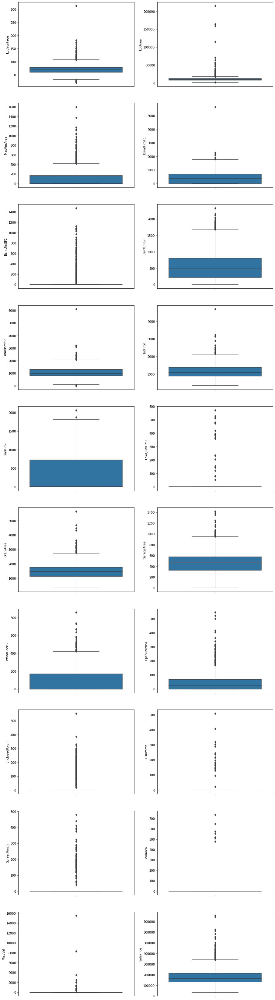

In [35]:
# Here we can see few outiers but when observe closely, from the below plots i.e., w.r.t to the correlation plot,scatter plot
# and box plot combined.
# we can say that the outliers seen are natural outliers because since Every outlier of one varible has a valid explanation
# in terms of other varibles.

plt.figure(figsize=(15,60))
for i,v in enumerate(numerical_var_data_analysis):
    plt.subplot(10,2,i+1)
    sns.boxplot(house_data_clean[v],orient="v")
plt.show()

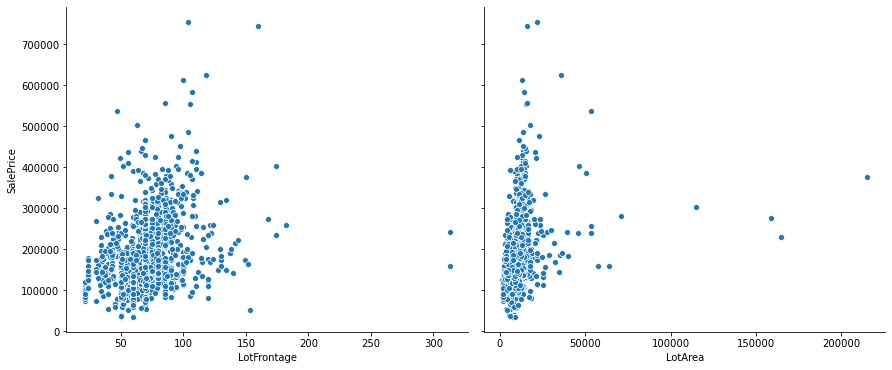

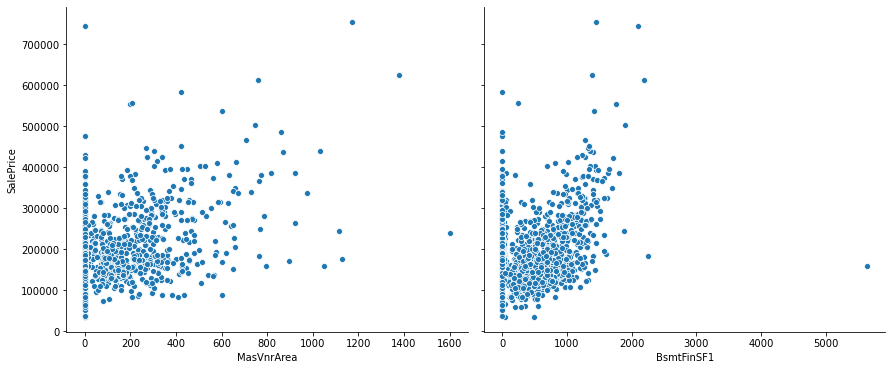

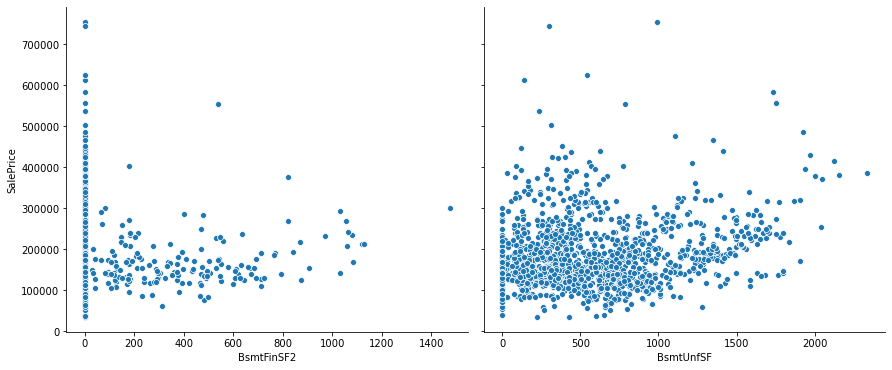

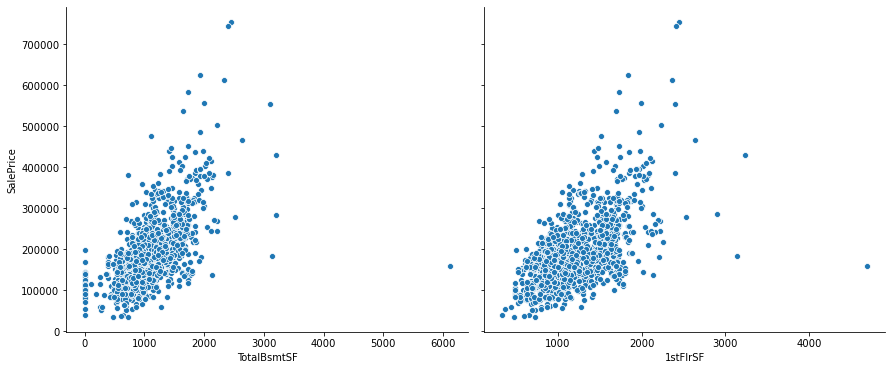

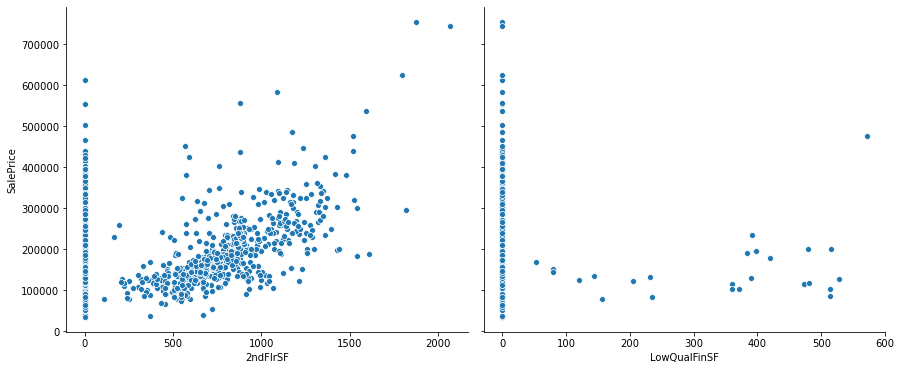

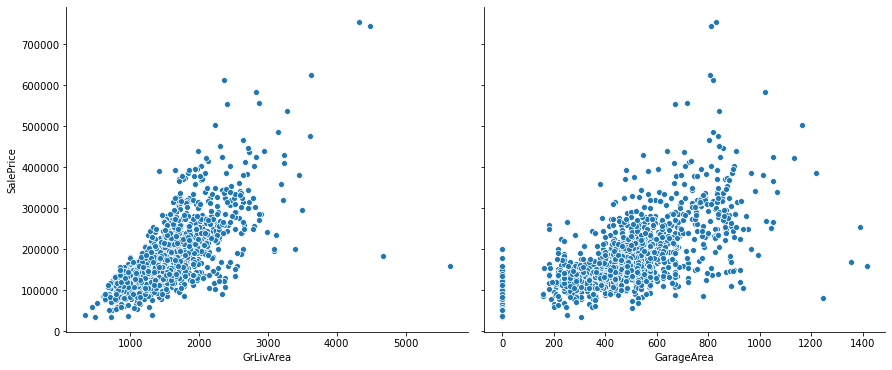

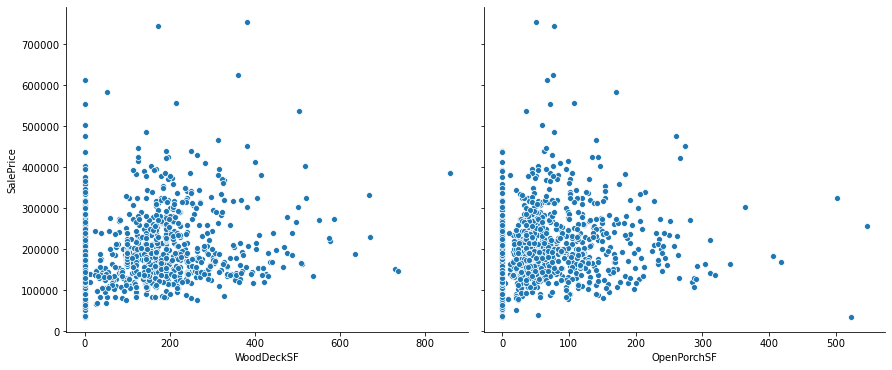

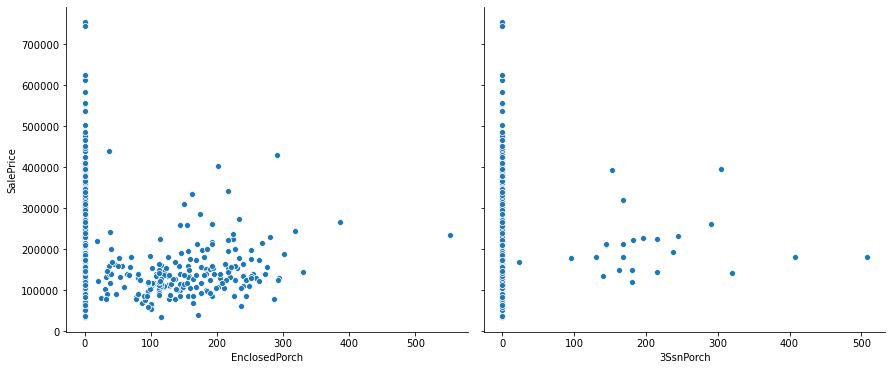

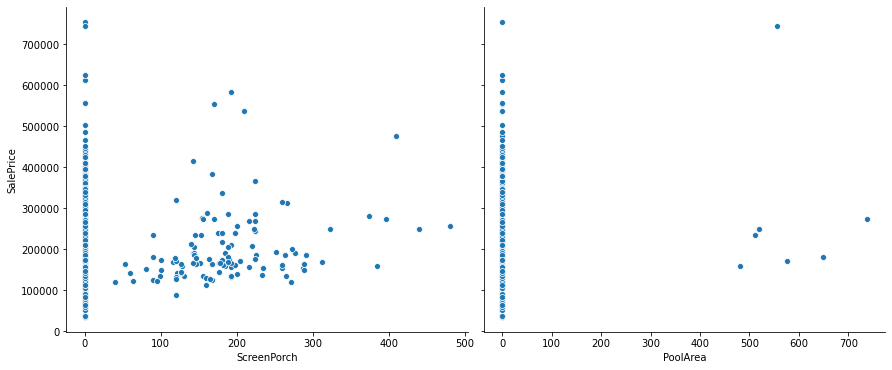

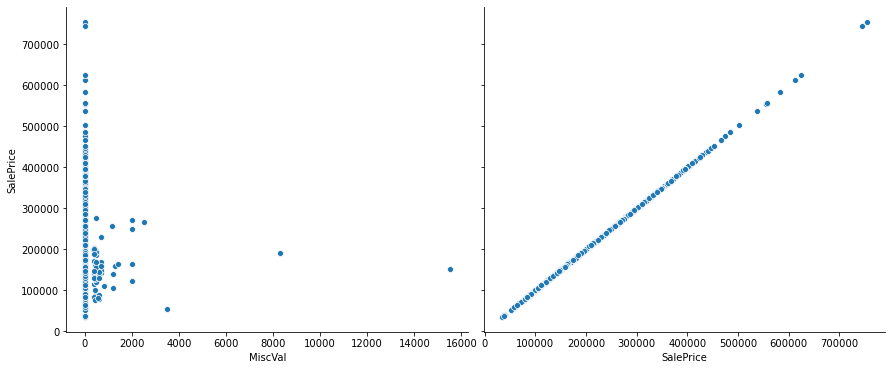

In [36]:
# creating pair plots for numerical data
# here we are observing the pattern of each variable w.r.t "SalePrice" as our target variable.
for i in range(0,19,2):
    sns.pairplot(house_data_clean,x_vars=numerical_var_data_analysis[i:i+2],y_vars="SalePrice",size=5,aspect=1.2,kind="scatter")
    plt.show()

In [37]:
# checking the correlation of all numerical variables
# Here we can obsereve that there is a good amount of correlation between the variables
house_data_clean[numerical_var_data_analysis].corr()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice
LotFrontage,1.000000,0.304694,0.179537,0.215778,0.042811,0.121921,0.363310,0.414725,0.073332,0.037657,0.368035,0.323181,0.074495,0.134766,0.010728,0.062188,0.037974,0.181300,-0.000184,0.333206
LotArea,0.304694,1.000000,0.104141,0.213081,0.111674,-0.004250,0.258538,0.295977,0.052979,0.004897,0.261152,0.180767,0.173170,0.086278,-0.023114,0.020568,0.043498,0.077885,0.038221,0.264668
MasVnrArea,0.179537,0.104141,1.000000,0.264469,-0.072443,0.114298,0.363667,0.344255,0.174874,-0.069127,0.390818,0.372990,0.159754,0.125461,-0.110363,0.018752,0.061367,0.011697,-0.029854,0.477486
BsmtFinSF1,0.215778,0.213081,0.264469,1.000000,-0.049498,-0.496605,0.520098,0.442838,-0.135330,-0.064447,0.205944,0.295374,0.205447,0.107279,-0.105887,0.026926,0.063139,0.141361,0.003852,0.383995
BsmtFinSF2,0.042811,0.111674,-0.072443,-0.049498,1.000000,-0.209806,0.106092,0.098654,-0.099445,0.014596,-0.008956,-0.017641,0.067684,0.004155,0.036680,-0.030211,0.088430,0.041597,0.004784,-0.010350
BsmtUnfSF,0.121921,-0.004250,0.114298,-0.496605,-0.209806,1.000000,0.415900,0.318053,0.006341,0.028245,0.240770,0.183865,-0.004180,0.130046,-0.003787,0.020825,-0.012585,-0.035168,-0.023884,0.215707
TotalBsmtSF,0.363310,0.258538,0.363667,0.520098,0.106092,0.415900,1.000000,0.818107,-0.171058,-0.033102,0.453975,0.486298,0.234420,0.244411,-0.100381,0.037867,0.085616,0.126850,-0.018345,0.613299
1stFlrSF,0.414725,0.295977,0.344255,0.442838,0.098654,0.318053,0.818107,1.000000,-0.198812,-0.014007,0.565895,0.490839,0.238824,0.210229,-0.072904,0.056838,0.090177,0.132670,-0.021003,0.606969
2ndFlrSF,0.073332,0.052979,0.174874,-0.135330,-0.099445,0.006341,-0.171058,-0.198812,1.000000,0.063632,0.690403,0.140046,0.090956,0.210906,0.064396,-0.024371,0.040904,0.081794,0.016301,0.322840
LowQualFinSF,0.037657,0.004897,-0.069127,-0.064447,0.014596,0.028245,-0.033102,-0.014007,0.063632,1.000000,0.135320,-0.067441,-0.025666,0.018797,0.061287,-0.004383,0.026605,0.062110,-0.003859,-0.025277


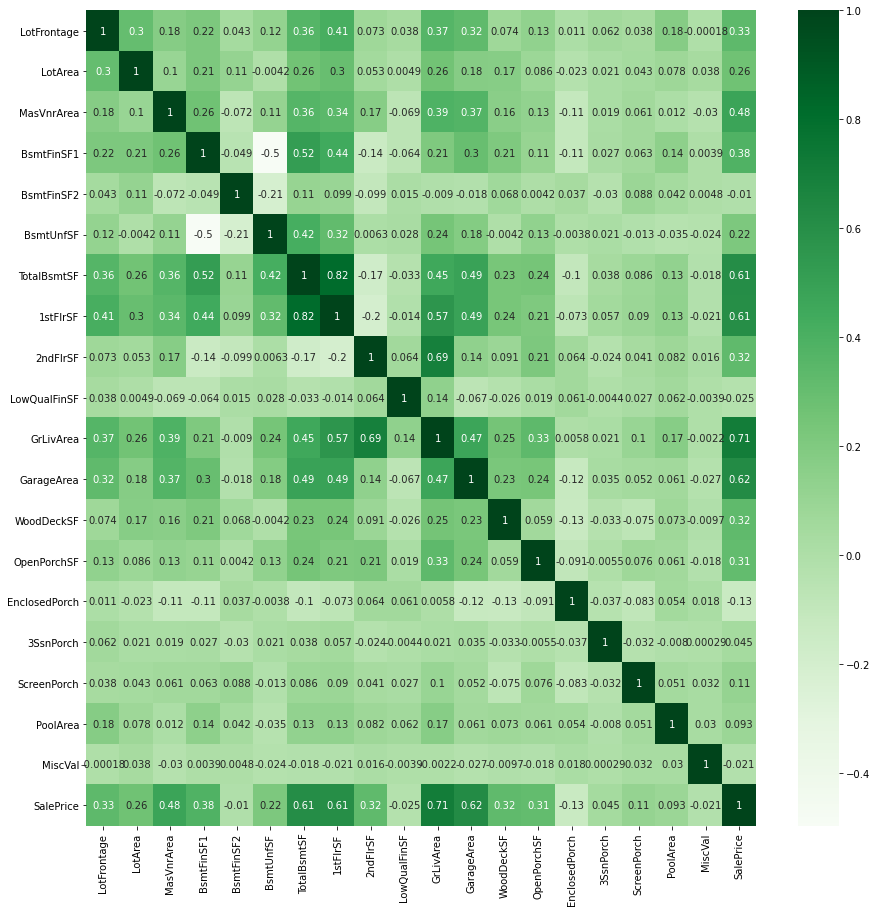

In [38]:
# plotting heatmap to observe the correlation between different numerical variables.
plt.figure(figsize=(15,15))
sns.heatmap(house_data_clean[numerical_var_data_analysis].corr(),annot=True,cmap="Greens")
plt.show()

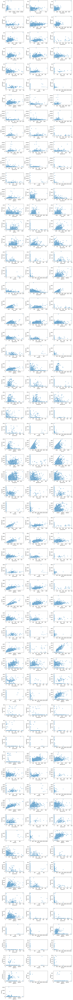

In [39]:
# plotting scatter plot to observe the behaviour of numerical variables. 
plt.figure(figsize=(15,250))
plt.subplots_adjust(hspace=0.5,wspace=0.3)
pltno = 1
for i,v in enumerate(numerical_var_data_analysis):
    for j in range(i+1,20):
        plt.subplot(70,3,pltno)
        sns.scatterplot(data=house_data_clean,x=numerical_var_data_analysis[j],y=v,)
        pltno+=1
plt.show()

#### Data Analysis for categorical type variables

In [40]:
# lets analyse categorical variables.
# extracting all the categorical variables for analysis.
catergorical_var_data_analysis = [x for x in house_data_clean.columns.to_list() if x not in numerical_var_data_analysis]
print(house_data_clean.shape)
house_data_clean[catergorical_var_data_analysis].head()

(1451, 80)


,MSSubClass,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,MoSold,YrSold,SaleType,SaleCondition
0,2-STORY 1946 & NEWER,RL,Pave,No_alley_access,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,1,0,2,1,3,1,Gd,8,Typ,0,No_Fireplace,Attchd,2003.0,RFn,2,TA,TA,Y,No_Pool,No_Fence,None,2,2008,WD,Normal
1,1-STORY 1946 & NEWER ALL STYLES,RL,Pave,No_alley_access,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Above Average,Very Good,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,TA,TA,Y,No_Pool,No_Fence,None,5,2007,WD,Normal
2,2-STORY 1946 & NEWER,RL,Pave,No_alley_access,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,TA,TA,Y,No_Pool,No_Fence,None,9,2008,WD,Normal
3,2-STORY 1945 & OLDER,RL,Pave,No_alley_access,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Good,Average,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,TA,TA,Y,No_Pool,No_Fence,None,2,2006,WD,Abnorml
4,2-STORY 1946 & NEWER,RL,Pave,No_alley_access,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Very Good,Average,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,TA,TA,Y,No_Pool,No_Fence,None,12,2008,WD,Normal


In [41]:
house_data_clean[catergorical_var_data_analysis].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1451 entries, 0 to 1459
Data columns (total 60 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1451 non-null   object 
 1   MSZoning       1451 non-null   object 
 2   Street         1451 non-null   object 
 3   Alley          1451 non-null   object 
 4   LotShape       1451 non-null   object 
 5   LandContour    1451 non-null   object 
 6   Utilities      1451 non-null   object 
 7   LotConfig      1451 non-null   object 
 8   LandSlope      1451 non-null   object 
 9   Neighborhood   1451 non-null   object 
 10  Condition1     1451 non-null   object 
 11  Condition2     1451 non-null   object 
 12  BldgType       1451 non-null   object 
 13  HouseStyle     1451 non-null   object 
 14  OverallQual    1451 non-null   object 
 15  OverallCond    1451 non-null   object 
 16  YearBuilt      1451 non-null   int64  
 17  YearRemodAdd   1451 non-null   int64  
 18  RoofStyl

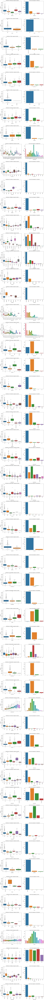

In [42]:
# ploting Distribution and count of a categorical variable to observe the effect of the frequncy of a particular sub categories.
# Here we can see in most of the cases majority of the data is explained by only one or two level of a categorical variable. 
# By this we can eliminate 
plt.figure(figsize=(16,430))
plt.subplots_adjust(hspace=0.43)
pltno = 1
for i,v in enumerate(catergorical_var_data_analysis):
    if v not in ["MSSubClass","GarageYrBlt","YearRemodAdd","YearBuilt"]:
        plt.subplot(60,2,pltno)
        plt.title(f"Distribution of '{v}' categorical variable")
        sns.boxplot(data=house_data_clean,x=catergorical_var_data_analysis[i],y="SalePrice")
        plt.xticks(rotation=90)
        pltno+=1
        plt.subplot(60,2,pltno)
        plt.title(f"Count of sub categories in '{v}'")
        sns.countplot(data=house_data_clean,x=catergorical_var_data_analysis[i])
        plt.xticks(rotation=90)
        pltno+=1
plt.show()

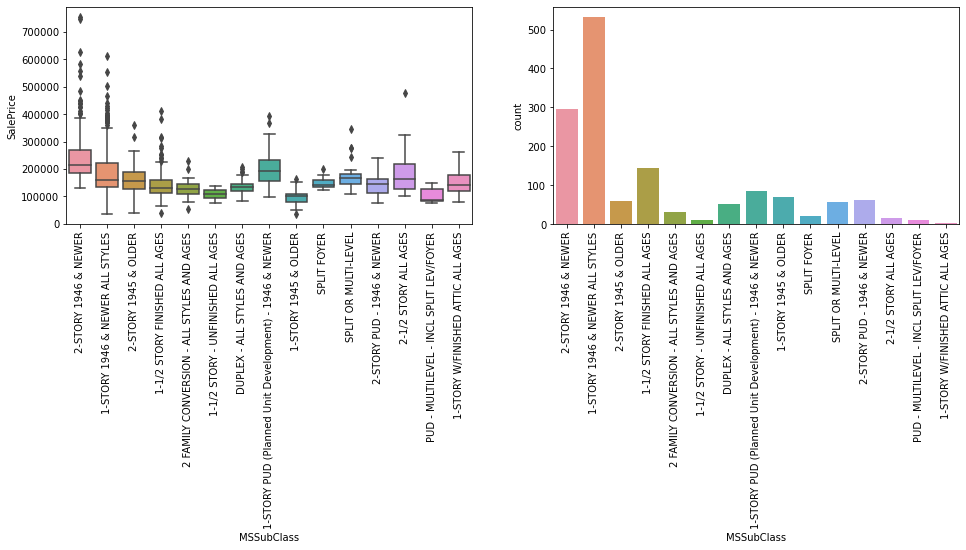

In [43]:
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
sns.boxplot(data=house_data_clean,x="MSSubClass",y="SalePrice")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
sns.countplot(data=house_data_clean,x="MSSubClass")
plt.xticks(rotation=90)
plt.show()

In [44]:
# creating the data frame with percentage of sublevels in a given category.
pd.set_option("display.max_rows",640)
data = []
for i in catergorical_var_data_analysis:
    data_temp = pd.DataFrame(house_data_clean[i].value_counts(1)).reset_index()
    data_temp["variables"] = i
    data_temp= data_temp.rename(columns={"index":"sublevels",i:"percentage_sublevels"})
    data.append(data_temp)
frequency_categories = pd.concat(data)
frequency_categories = frequency_categories[["variables","sublevels","percentage_sublevels"]]
frequency_categories = frequency_categories.reset_index(drop=True)
frequency_categories

,variables,sublevels,percentage_sublevels
0,MSSubClass,1-STORY 1946 & NEWER ALL STYLES,0.366644
1,MSSubClass,2-STORY 1946 & NEWER,0.203997
2,MSSubClass,1-1/2 STORY FINISHED ALL AGES,0.099242
3,MSSubClass,1-STORY PUD (Planned Unit Development) - 1946 ...,0.059269
4,MSSubClass,1-STORY 1945 & OLDER,0.047553
5,MSSubClass,2-STORY PUD - 1946 & NEWER,0.043418
6,MSSubClass,2-STORY 1945 & OLDER,0.041351
7,MSSubClass,SPLIT OR MULTI-LEVEL,0.039283
8,MSSubClass,DUPLEX - ALL STYLES AND AGES,0.035837
9,MSSubClass,2 FAMILY CONVERSION - ALL STYLES AND AGES,0.020675


In [45]:
house_data_analysis = house_data_clean.copy()
house_data_analysis.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,2-STORY 1946 & NEWER,RL,65.0,8450,Pave,No_alley_access,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No_Fireplace,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No_Pool,No_Fence,None,0,2,2008,WD,Normal,208500
1,1-STORY 1946 & NEWER ALL STYLES,RL,80.0,9600,Pave,No_alley_access,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Above Average,Very Good,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No_Pool,No_Fence,None,0,5,2007,WD,Normal,181500
2,2-STORY 1946 & NEWER,RL,68.0,11250,Pave,No_alley_access,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No_Pool,No_Fence,None,0,9,2008,WD,Normal,223500
3,2-STORY 1945 & OLDER,RL,60.0,9550,Pave,No_alley_access,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Good,Average,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No_Pool,No_Fence,None,0,2,2006,WD,Abnorml,140000
4,2-STORY 1946 & NEWER,RL,84.0,14260,Pave,No_alley_access,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Very Good,Average,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No_Pool,No_Fence,None,0,12,2008,WD,Normal,250000


In [46]:
# Here i would like leave the categories which explain about quality and condition along with some other explanatory variables
Qual_Cond_Vars =[] # variables that explain about quality and condition and some other important attributes.
for i in catergorical_var_data_analysis:
    if len(i.split("Qual"))==2 or len(i.split("Cond"))==2 or len(i.split("QC"))==2 or len(i.split("Qu"))==2:
        if i not in ["Condition1","Condition2"]:
            Qual_Cond_Vars.append(i)
    elif i in ["GarageYrBlt","YearRemodAdd","YearBuilt","YrSold","MoSold","Neighborhood"]:
        Qual_Cond_Vars.append(i)
        
# Combining the sub-categories that have less that 5% of the data to one sub-category "Others".        
for i in catergorical_var_data_analysis:
    if i not in Qual_Cond_Vars:
        if (frequency_categories[frequency_categories.variables == i].percentage_sublevels <= 0.05).to_list().count(True)>=2:
            for v in frequency_categories[frequency_categories.variables==i].sublevels.unique():
                if frequency_categories[(frequency_categories.variables== i) & (frequency_categories.sublevels== v)].percentage_sublevels.to_list()[0]<=0.05:
                    house_data_analysis[i] = house_data_analysis[i].replace(v,"Others")

house_data_analysis.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,2-STORY 1946 & NEWER,RL,65.0,8450,Pave,No_alley_access,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No_Fireplace,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No_Pool,No_Fence,None,0,2,2008,WD,Normal,208500
1,1-STORY 1946 & NEWER ALL STYLES,RL,80.0,9600,Pave,No_alley_access,Reg,Lvl,AllPub,Others,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Above Average,Very Good,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No_Pool,No_Fence,None,0,5,2007,WD,Normal,181500
2,2-STORY 1946 & NEWER,RL,68.0,11250,Pave,No_alley_access,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No_Pool,No_Fence,None,0,9,2008,WD,Normal,223500
3,Others,RL,60.0,9550,Pave,No_alley_access,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Good,Average,1915,1970,Gable,CompShg,Wd Sdng,Others,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No_Pool,No_Fence,None,0,2,2006,WD,Abnorml,140000
4,2-STORY 1946 & NEWER,RL,84.0,14260,Pave,No_alley_access,IR1,Lvl,AllPub,Others,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Very Good,Average,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No_Pool,No_Fence,None,0,12,2008,WD,Normal,250000


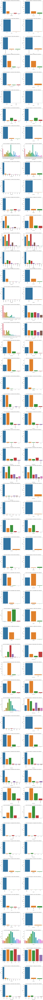

In [47]:
# plotting the count of the categorical variables before and after modification.
plt.figure(figsize=(16,430))
plt.subplots_adjust(hspace=0.43)
pltno = 1
for i,v in enumerate(catergorical_var_data_analysis):
    if v not in ["MSSubClass","GarageYrBlt","YearRemodAdd","YearBuilt"]:
        plt.subplot(60,2,pltno)
        plt.title(f"Count of sub categories in '{v}' before modification")
        sns.countplot(data=house_data_clean,x=catergorical_var_data_analysis[i])
        plt.xticks(rotation=90)
        pltno+=1
        plt.subplot(60,2,pltno)
        plt.title(f"Count of sub categories in '{v}' after modification")
        sns.countplot(data=house_data_analysis,x=catergorical_var_data_analysis[i])
        plt.xticks(rotation=90)
        pltno+=1
plt.show()

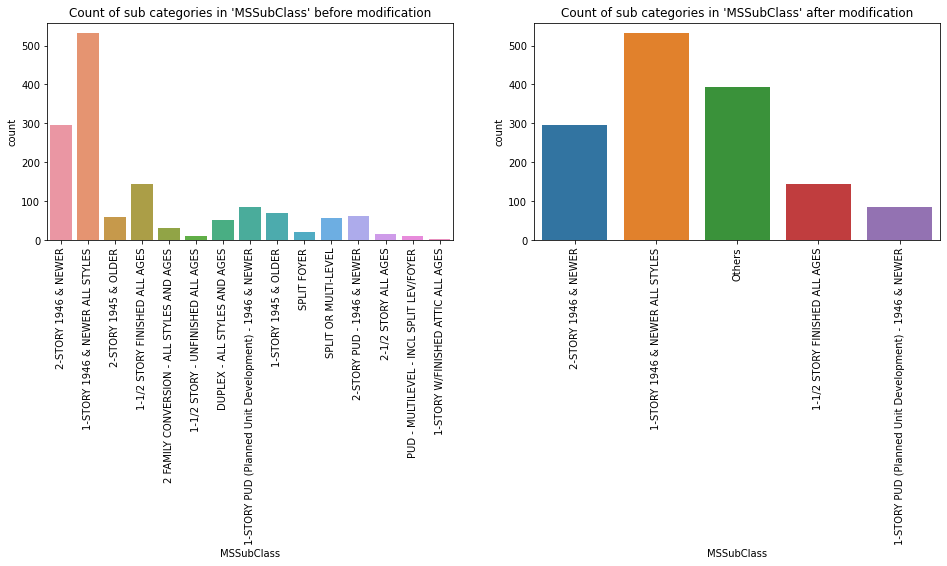

In [48]:
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
plt.title(f"Count of sub categories in 'MSSubClass' before modification")
sns.countplot(data=house_data_clean,x="MSSubClass")
plt.xticks(rotation=90)
plt.subplot(1,2,2)
plt.title(f"Count of sub categories in 'MSSubClass' after modification")
sns.countplot(data=house_data_analysis,x="MSSubClass")
plt.xticks(rotation=90)
plt.show()

In [49]:
# Observing variables with "years"
house_data_years = house_data_clean[["GarageYrBlt","YearRemodAdd","YearBuilt","SalePrice"]]
house_data_years.head()

,GarageYrBlt,YearRemodAdd,YearBuilt,SalePrice
0,2003.0,2003,2003,208500
1,1976.0,1976,1976,181500
2,2001.0,2002,2001,223500
3,1998.0,1970,1915,140000
4,2000.0,2000,2000,250000


In [50]:
# segmenting year variables
house_data_years["GarageYrBlt_seggregated"]= pd.qcut(house_data_years.GarageYrBlt,q=5)
house_data_years["YearRemodAdd_seggregated"]= pd.qcut(house_data_years.YearRemodAdd,q=5)
house_data_years["YearBuilt_seggregated"]= pd.qcut(house_data_years.YearBuilt,q=5)
house_data_years.head()

,GarageYrBlt,YearRemodAdd,YearBuilt,SalePrice,GarageYrBlt_seggregated,YearRemodAdd_seggregated,YearBuilt_seggregated
0,2003.0,2003,2003,208500,"(1990.0, 2003.0]","(1998.0, 2005.0]","(1983.0, 2003.0]"
1,1976.0,1976,1976,181500,"(1969.0, 1990.0]","(1961.0, 1980.0]","(1965.0, 1983.0]"
2,2001.0,2002,2001,223500,"(1990.0, 2003.0]","(1998.0, 2005.0]","(1983.0, 2003.0]"
3,1998.0,1970,1915,140000,"(1990.0, 2003.0]","(1961.0, 1980.0]","(1871.999, 1947.0]"
4,2000.0,2000,2000,250000,"(1990.0, 2003.0]","(1998.0, 2005.0]","(1983.0, 2003.0]"


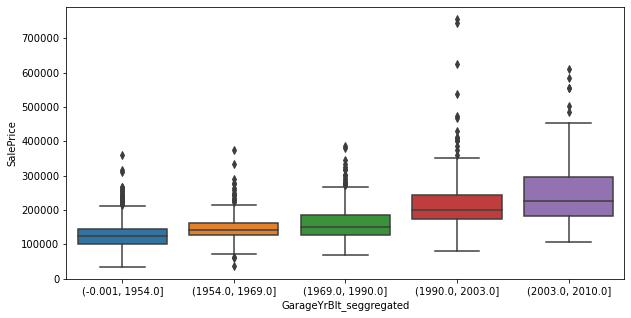

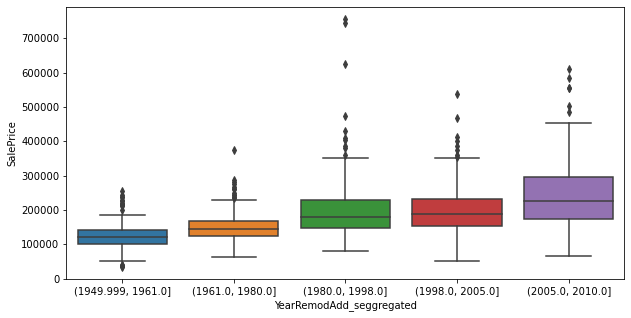

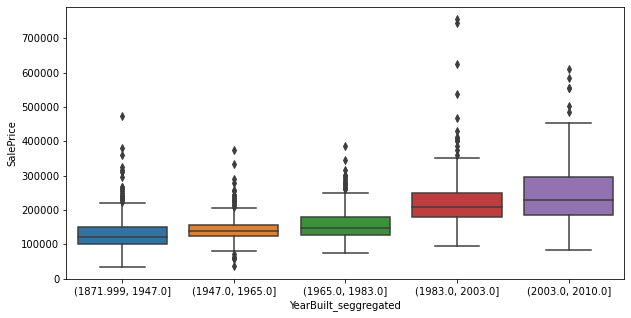

In [51]:
# Here we can see that newly or recently built house is expected have high SalePrice compared to others or 
# SalePrice increases gradually form old built to newly built house
plt.figure(figsize=(10,5))
sns.boxplot(x=house_data_years.GarageYrBlt_seggregated,y=house_data_years.SalePrice)
plt.show()
plt.figure(figsize=(10,5))
sns.boxplot(x=house_data_years.YearRemodAdd_seggregated,y=house_data_years.SalePrice)
plt.show()
plt.figure(figsize=(10,5))
sns.boxplot(x=house_data_years.YearBuilt_seggregated,y=house_data_years.SalePrice)
plt.show()

### Data Preparation

In [52]:
print(house_data_analysis.shape)
house_data_analysis.head()

(1451, 80)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,2-STORY 1946 & NEWER,RL,65.0,8450,Pave,No_alley_access,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,No_Fireplace,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,No_Pool,No_Fence,None,0,2,2008,WD,Normal,208500
1,1-STORY 1946 & NEWER ALL STYLES,RL,80.0,9600,Pave,No_alley_access,Reg,Lvl,AllPub,Others,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Above Average,Very Good,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,No_Pool,No_Fence,None,0,5,2007,WD,Normal,181500
2,2-STORY 1946 & NEWER,RL,68.0,11250,Pave,No_alley_access,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Good,Average,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,No_Pool,No_Fence,None,0,9,2008,WD,Normal,223500
3,Others,RL,60.0,9550,Pave,No_alley_access,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Good,Average,1915,1970,Gable,CompShg,Wd Sdng,Others,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,No_Pool,No_Fence,None,0,2,2006,WD,Abnorml,140000
4,2-STORY 1946 & NEWER,RL,84.0,14260,Pave,No_alley_access,IR1,Lvl,AllPub,Others,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Very Good,Average,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,No_Pool,No_Fence,None,0,12,2008,WD,Normal,250000


In [53]:
# create the dummy variables for a given feature which has more the 2 levels.
# Here i would like to use all the sublevels without droping the any feature to know the effect of all "n" feature in a categorical
# variable w.r.t target variable
house_data_preparation = pd.get_dummies(data=house_data_analysis,columns=catergorical_var_data_analysis)
pd.set_option("display.max_columns",547)
print(house_data_preparation.shape)
house_data_preparation.head()

(1451, 547)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearR

#### Splitting the Data into Training and Testing Sets

In [54]:
from sklearn.model_selection import train_test_split

In [55]:
house_data_preparation_train,house_data_preparation_test = train_test_split(house_data_preparation,train_size = 0.7,test_size = 0.3,random_state = 100)
print(house_data_preparation_train.shape)
house_data_preparation_train.head()

(1015, 547)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearR

In [56]:
# Rescaling all the numerical variables
from sklearn.preprocessing import MinMaxScaler

In [57]:
scaler = MinMaxScaler()

In [58]:
house_data_preparation_train[numerical_var_data_analysis] = scaler.fit_transform(house_data_preparation_train[numerical_var_data_analysis])
house_data_preparation_train.head()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearR

In [59]:
house_data_preparation_train.describe()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearR

#### Dividing the training data into X_train and y_train for the model building

In [60]:
y_train = house_data_preparation_train.pop("SalePrice")
X_train = house_data_preparation_train

In [61]:
print(X_train.shape)
X_train.head()

(1015, 546)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_19

In [62]:
y_train

801     0.105619
569     0.142318
1181    0.503591
808     0.176102
1095    0.199313
          ...   
805     0.271483
53      0.493029
351     0.218420
79      0.105760
795     0.191663
Name: SalePrice, Length: 1015, dtype: float64

### Building a linear model

### 1) Multiple Linear Regression Model

In [63]:
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

- Using RFE
- Now, we have 546 predictor features. To build the model using RFE, we need to tell RFE how many features we want in the final model. It then runs a feature elimination algorithm.
- Note that the number of features to be used in the model is a hyperparameter.
- For selecting the number of features(Hyperparameter)to be used in the model, we can use Grid-Search CV but here in this can we have very high number of attributes and performing Grid-Search CV will consume lot of time.
- For this particualr case we can consider top 150 variables and can proceed with the next step.

In [64]:
lm = LinearRegression()
lm = lm.fit(X_train,y_train)

rfe = RFE(lm,150)
rfe = rfe.fit(X_train,y_train)

In [65]:
# Top 150 variables which are significant as per RFE
lm_RFE = pd.DataFrame({"attributes" : X_train.columns,"rfe.support_":rfe.support_,"rfe.ranking_":rfe.ranking_})
lm_RFE = lm_RFE.sort_values("rfe.ranking_")
lm_RFE

,attributes,rfe.support_,rfe.ranking_
545,SaleCondition_Partial,True,1
370,TotRmsAbvGrd_9,True,1
369,TotRmsAbvGrd_8,True,1
368,TotRmsAbvGrd_7,True,1
367,TotRmsAbvGrd_6,True,1
366,TotRmsAbvGrd_5,True,1
365,TotRmsAbvGrd_4,True,1
364,KitchenQual_TA,True,1
363,KitchenQual_Gd,True,1
362,KitchenQual_Fa,True,1


In [66]:
# defining a function for building a model and returning the summary of that model.
def OLS(X_train,y_train):
    X_train_sm = sm.add_constant(X_train)
    lr_sm = sm.OLS(y_train,X_train_sm)
    lr_sm = lr_sm.fit()
    return lr_sm

In [67]:
# defining a function for VIF.
def VIF(X_train):
    vif = [round(variance_inflation_factor(X_train.values,i),2) for i in range(X_train.shape[1])]
    VIF = pd.DataFrame({"attributes":X_train.columns,"VIF":vif})
    VIF = VIF.sort_values("VIF",ascending=False)
    return(VIF)

In [68]:
# These are top 150 atributes that has been extracted using RFE
required_attributes = ['MSSubClass_1-1/2 STORY FINISHED ALL AGES','MSSubClass_1-STORY 1946 & NEWER ALL STYLES',
 'MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER','MSSubClass_2-STORY 1946 & NEWER','MSSubClass_Others','Street_Grvl','Street_Pave','Alley_No_alley_access',
 'Alley_Others','LotShape_IR1','LotShape_Others','LotShape_Reg','LandContour_Lvl','LandContour_Others','Utilities_AllPub',
 'Utilities_NoSeWa','LotConfig_Corner','LotConfig_CulDSac','LotConfig_Inside','LotConfig_Others','LandSlope_Gtl',
 'LandSlope_Others','Condition1_Feedr','Condition1_Norm','Condition1_Others','Condition2_Norm','Condition2_Others','BldgType_1Fam',
 'BldgType_Others','BldgType_TwnhsE','HouseStyle_1.5Fin','HouseStyle_1Story','HouseStyle_2Story','HouseStyle_Others',
 'OverallCond_Above Average','OverallCond_Average','OverallCond_Below Average','OverallCond_Excellent','OverallCond_Fair',
 'OverallCond_Good','OverallCond_Poor','OverallCond_Very Good','YearBuilt_1906','YearBuilt_1931','YearBuilt_1942',
 'YearBuilt_1952','YearBuilt_1969','YearBuilt_2001','YearRemodAdd_1952','RoofStyle_Gable','RoofStyle_Hip','RoofStyle_Others',
 'RoofMatl_CompShg','RoofMatl_Others','Exterior2nd_HdBoard','Exterior2nd_MetalSd','Exterior2nd_Others','Exterior2nd_Plywood',
 'Exterior2nd_VinylSd','Exterior2nd_Wd Sdng','BsmtQual_No_Basement','BsmtCond_Fa','BsmtCond_Gd','BsmtCond_No_Basement',
 'BsmtCond_Po','BsmtCond_TA','BsmtExposure_Av','BsmtExposure_Gd','BsmtExposure_Mn','BsmtExposure_No','BsmtExposure_No_Basement',
 'BsmtFinType1_No_Basement','BsmtFinType2_Others','BsmtFinType2_Unf','Heating_GasA','Heating_Others','CentralAir_N','CentralAir_Y',
 'Electrical_FuseA','Electrical_Others','Electrical_SBrkr','BsmtHalfBath_0','BsmtHalfBath_1','BsmtHalfBath_2','FullBath_1','FullBath_2','FullBath_Others',
 'BedroomAbvGr_2','BedroomAbvGr_3','BedroomAbvGr_4','BedroomAbvGr_Others','KitchenAbvGr_1','KitchenAbvGr_Others','KitchenQual_Ex',
 'KitchenQual_Fa','KitchenQual_Gd','KitchenQual_TA','Functional_Others','Functional_Typ','Fireplaces_0','Fireplaces_1','Fireplaces_2',
 'Fireplaces_3','FireplaceQu_Ex','FireplaceQu_Fa','FireplaceQu_Gd','FireplaceQu_No_Fireplace','FireplaceQu_Po','FireplaceQu_TA',
 'GarageYrBlt_1906.0','GarageYrBlt_1931.0','GarageYrBlt_1942.0','GarageYrBlt_2001.0','GarageFinish_Fin','GarageFinish_RFn',
 'GarageFinish_Unf','GarageCars_1','GarageCars_2','GarageCars_3','GarageCars_4','GarageQual_Ex','GarageQual_Fa','GarageQual_Gd',
 'GarageQual_Po','GarageQual_TA','GarageCond_Ex','GarageCond_Fa','GarageCond_Gd','GarageCond_Po','GarageCond_TA','PavedDrive_N',
 'PavedDrive_P','PavedDrive_Y','PoolQC_Ex','PoolQC_Fa','PoolQC_Gd','PoolQC_No_Pool','MiscFeature_None','MiscFeature_Others',
 'YrSold_2006','YrSold_2007','YrSold_2008','YrSold_2009','YrSold_2010','SaleCondition_Abnorml','SaleCondition_AdjLand','SaleCondition_Alloca',
 'SaleCondition_Family','SaleCondition_Normal','SaleCondition_Partial']

In [69]:
# Importing clear_output
from IPython.display import clear_output

In [70]:
required_attributes # Priliminary attributes obtained from RFE.

# Here we are obtaining the consolidated dataframe with "VIF" and "Pvalues" for a given X_train and y_train.
def get_vif_pvalues(X_train,y_train):
    lm = OLS(X_train[required_attributes],y_train)
    vif = [round(variance_inflation_factor(X_train[required_attributes].values,i),2) for i in range(X_train[required_attributes].shape[1])]
    d = pd.DataFrame({"attributes":X_train[required_attributes].columns,"VIF":vif})
    d["Pvalues"] = lm.pvalues.to_list()[1:]
    d = d.sort_values("Pvalues",ascending=False)
    return d

# identifying the attributes that has been removed from the model
removed_attributes = [] 
removed_p_values = []
removed_vif_values = []

# Eliminating high "P-values" and high "VIF" values and obtaining optimal linear regression model.
def get_optimal_lm_model():
    d = get_vif_pvalues(X_train,y_train)
    clear_output(wait=True)
    print("Elimination of attributes is under process, we have",len(d),"variables")
    for i in required_attributes:
        if (d[d.attributes==i].Pvalues.to_list()[0] >= 0.05):
            if d[d.attributes==i].Pvalues.to_list()[0] == d.Pvalues.max():
                removed_attributes.append(i)
                removed_p_values.append(d[d.attributes==i].Pvalues.to_list()[0])
                removed_vif_values.append(d[d.attributes==i].VIF.to_list()[0])
                required_attributes.remove(i)
                get_optimal_lm_model()
        elif (list(d.Pvalues<0.05).count(False)) == 0:
            if (d[d.attributes==i].VIF.to_list()[0] > 5):
                if d[d.attributes==i].VIF.to_list()[0] == d.VIF.max():
                    removed_attributes.append(i)
                    removed_p_values.append(d[d.attributes==i].Pvalues.to_list()[0])
                    removed_vif_values.append(d[d.attributes==i].VIF.to_list()[0])
                    required_attributes.remove(i)
                    get_optimal_lm_model()                
    d = get_vif_pvalues(X_train,y_train)
    return d
get_optimal_lm_model()

Elimination of attributes is under process, we have 37 variables


,attributes,VIF,Pvalues
13,CentralAir_N,1.43,3.226994e-02
4,BldgType_1Fam,0.72,3.122614e-02
14,BsmtHalfBath_0,3.27,2.421375e-02
18,BedroomAbvGr_Others,1.55,1.989509e-02
7,OverallCond_Fair,1.07,9.247253e-03
35,SaleCondition_Normal,0.85,7.104022e-03
31,GarageQual_Ex,1.05,6.914881e-03
3,Condition1_Others,1.17,4.438604e-03
5,HouseStyle_1Story,1.34,2.903077e-03
30,GarageCars_4,1.04,2.779855e-03


In [71]:
# Unwanted set of data after performing feature elimination using "P-values" and "VIF".(for reference)
unwanted_features = pd.DataFrame({"removed_attributes":removed_attributes,
                                  "removed_p_values":removed_p_values,
                                  "removed_vif_values":removed_vif_values})
unwanted_features

,removed_attributes,removed_p_values,removed_vif_values
0,FireplaceQu_Po,8.480126e-01,3.174822e+09
1,YearBuilt_1931,6.281154e-01,2.500000e+00
2,GarageYrBlt_1931.0,8.566712e-01,1.190000e+00
3,BsmtExposure_Gd,9.561576e-01,1.579237e+06
4,YearBuilt_1969,5.997601e-01,1.120000e+00
5,YearBuilt_2001,7.049500e-01,2.287711e+08
6,GarageYrBlt_1942.0,6.832027e-01,inf
7,YearRemodAdd_1952,9.683506e-01,6.422227e+07
8,KitchenQual_Ex,8.215880e-01,2.460038e+07
9,YearBuilt_1942,5.094266e-01,1.080000e+00


In [72]:
required_attributes # attributes after eliminating the varaible based on p-value and VIF

['MSSubClass_Others',
 'LotConfig_CulDSac',
 'Condition1_Feedr',
 'Condition1_Others',
 'BldgType_1Fam',
 'HouseStyle_1Story',
 'OverallCond_Below Average',
 'OverallCond_Fair',
 'RoofStyle_Hip',
 'BsmtExposure_Av',
 'BsmtExposure_Mn',
 'BsmtExposure_No',
 'BsmtExposure_No_Basement',
 'CentralAir_N',
 'BsmtHalfBath_0',
 'FullBath_2',
 'BedroomAbvGr_2',
 'BedroomAbvGr_3',
 'BedroomAbvGr_Others',
 'KitchenQual_Fa',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'Fireplaces_1',
 'FireplaceQu_Ex',
 'FireplaceQu_Fa',
 'FireplaceQu_Gd',
 'FireplaceQu_TA',
 'GarageFinish_Unf',
 'GarageCars_2',
 'GarageCars_3',
 'GarageCars_4',
 'GarageQual_Ex',
 'GarageQual_Gd',
 'GarageCond_TA',
 'PoolQC_Ex',
 'SaleCondition_Normal',
 'SaleCondition_Partial']

In [73]:
# building a final model using the required attributes.
lm_model = OLS(X_train[required_attributes],y_train)
lm_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.770
Model:                            OLS   Adj. R-squared:                  0.762
Method:                 Least Squares   F-statistic:                     88.62
Date:                Mon, 26 Apr 2021   Prob (F-statistic):          6.91e-283
Time:                        20:14:36   Log-Likelihood:                 1533.6
No. Observations:                1015   AIC:                            -2991.
Df Residuals:                     977   BIC:                            -2804.
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
const                         0.2709      0.017     16.340      0.000       0.238       0.303
MSSubClass_Others            -0.0233      0.005     -4.615      0.000      -0.033      -0.013
LotConfig_CulDSac             0.0278      0.007      3.806      0.000       0.013       0.042
Condition1_Feedr             -0.0235      0.008     -3.027      0.003      -0.039      -0.008
Condition1_Others            -0.0184      0.006     -2.852      0.004      -0.031      -0.006
BldgType_1Fam                 0.0121      0.006      2.157      0.031       0.001       0.023
HouseStyle_1Story            -0.0122      0.004     -2.985      0.003      -0.020      -0.004
OverallCond_Below Average    -0.0323      0.009     -3.403      0.001      -0.051      -0.014
OverallCond_Fair             -0.0381      0.015     -2.608      0.009      -0.067      -0.009
RoofStyle_Hip                 0.0249      0.005      5.207      0.000       0.016       0.034
BsmtExposure_Av              -0.0427      0.007     -5.761      0.000      -0.057      -0.028
BsmtExposure_Mn              -0.0416      0.009     -4.860      0.000      -0.058      -0.025
BsmtExposure_No              -0.0522      0.006     -8.076      0.000      -0.065      -0.039
BsmtExposure_No_Basement     -0.0780      0.014     -5.646      0.000      -0.105      -0.051
CentralAir_N                 -0.0175      0.008     -2.144      0.032      -0.034      -0.001
BsmtHalfBath_0                0.0175      0.008      2.257      0.024       0.002       0.033
FullBath_2                    0.0208      0.005      4.523      0.000       0.012       0.030
BedroomAbvGr_2               -0.0381      0.007     -5.833      0.000      -0.051      -0.025
BedroomAbvGr_3               -0.0335      0.006     -6.096      0.000      -0.044      -0.023
BedroomAbvGr_Others          -0.0218      0.009     -2.332      0.020      -0.040      -0.003
KitchenQual_Fa               -0.0923      0.015     -6.034      0.000      -0.122      -0.062
KitchenQual_Gd               -0.0795      0.008    -10.087      0.000      -0.095      -0.064
KitchenQual_TA               -0.1121      0.009    -13.104      0.000      -0.129      -0.095
Fireplaces_1                 -0.0375      0.006     -5.901      0.000      -0.050      -0.025
FireplaceQu_Ex                0.0736      0.016      4.654      0.000       0.043       0.105
FireplaceQu_Fa                0.0442      0.013      3.496      0.000       0.019       0.069
FireplaceQu_Gd                0.0622      0.007      8.837      0.000       0.048       0.076
FireplaceQu_TA                0.0610      0.007      8.195      0.000       0.046       0.076
GarageFinish_Unf             -0.0174      0.004     -4.034      0.000      -0.026      -0.009
GarageCars_2                  0.0263      0.005      5.429      0.000      

In [74]:
VIF(X_train[required_attributes])

,attributes,VIF
21,KitchenQual_TA,4.84
26,FireplaceQu_TA,3.93
16,BedroomAbvGr_2,3.29
14,BsmtHalfBath_0,3.27
20,KitchenQual_Gd,2.85
22,Fireplaces_1,2.74
29,GarageCars_3,2.57
9,BsmtExposure_Av,2.56
33,GarageCond_TA,2.31
36,SaleCondition_Partial,2.29


### Residual Analysis
- lets check if the error terms are normally distributed (which is infact, one of the major assumptions of linear 'regression), let us plot the histogram of the error terms and see what it looks like.
- Also lets check for independence and equal variance.

- After Residual Analysis we can see that we have an ideal model with all the error terms "Normally Distributed" and with equal variance and independence when plotted againts y_ predicted values.

In [75]:
print(X_train.shape)
X_train.head()

(1015, 546)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_19

In [76]:
# After eliminating all the unwanted attributes, below are the attributes that has been used in model building
required_attributes

['MSSubClass_Others',
 'LotConfig_CulDSac',
 'Condition1_Feedr',
 'Condition1_Others',
 'BldgType_1Fam',
 'HouseStyle_1Story',
 'OverallCond_Below Average',
 'OverallCond_Fair',
 'RoofStyle_Hip',
 'BsmtExposure_Av',
 'BsmtExposure_Mn',
 'BsmtExposure_No',
 'BsmtExposure_No_Basement',
 'CentralAir_N',
 'BsmtHalfBath_0',
 'FullBath_2',
 'BedroomAbvGr_2',
 'BedroomAbvGr_3',
 'BedroomAbvGr_Others',
 'KitchenQual_Fa',
 'KitchenQual_Gd',
 'KitchenQual_TA',
 'Fireplaces_1',
 'FireplaceQu_Ex',
 'FireplaceQu_Fa',
 'FireplaceQu_Gd',
 'FireplaceQu_TA',
 'GarageFinish_Unf',
 'GarageCars_2',
 'GarageCars_3',
 'GarageCars_4',
 'GarageQual_Ex',
 'GarageQual_Gd',
 'GarageCond_TA',
 'PoolQC_Ex',
 'SaleCondition_Normal',
 'SaleCondition_Partial']

In [77]:
X_train_sm = sm.add_constant(X_train[required_attributes])

In [78]:
print(X_train_sm.shape)
X_train_sm.head()

(1015, 38)


,const,MSSubClass_Others,LotConfig_CulDSac,Condition1_Feedr,Condition1_Others,BldgType_1Fam,HouseStyle_1Story,OverallCond_Below Average,OverallCond_Fair,RoofStyle_Hip,BsmtExposure_Av,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_No_Basement,CentralAir_N,BsmtHalfBath_0,FullBath_2,BedroomAbvGr_2,BedroomAbvGr_3,BedroomAbvGr_Others,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Fireplaces_1,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_TA,GarageFinish_Unf,GarageCars_2,GarageCars_3,GarageCars_4,GarageQual_Ex,GarageQual_Gd,GarageCond_TA,PoolQC_Ex,SaleCondition_Normal,SaleCondition_Partial
801,1.0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0
569,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0,1,0,1,0
1181,1.0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,1
808,1.0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,1,0
1095,1.0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,1,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,1,0,1,0


In [79]:
y_train_pred = lm_model.predict(X_train_sm)

In [80]:
err = y_train-y_train_pred

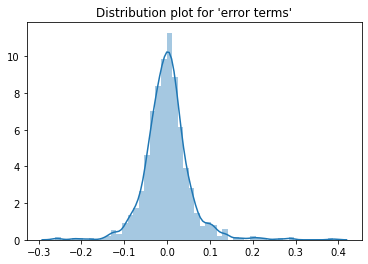

In [81]:
# plotting the error terms
# here can observe that all the error terms are normally distributed
plt.title("Distribution plot for 'error terms'")
sns.distplot(err)
plt.show()

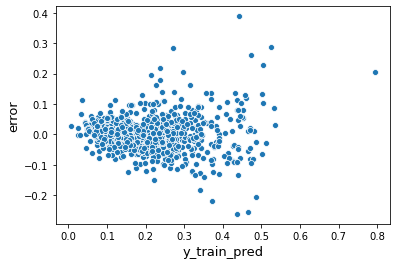

In [82]:
# plotting the error terms againts y_train_pred to check the independence and equal variance of error terms
sns.scatterplot(y_train_pred,err)
plt.xlabel("y_train_pred",size = 13)
plt.ylabel("error",size = 13)
plt.show()

###  Making Predictions
- Now we have the model and also analysed the residuals lets use this model to make predictions

In [83]:
# load the test data on which we can make our predictions
print(house_data_preparation_test.shape)
house_data_preparation_test.head()

(436, 547)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearR

In [84]:
# scaling the test dataset
house_data_preparation_test[numerical_var_data_analysis] = scaler.transform(house_data_preparation_test[numerical_var_data_analysis])
print(house_data_preparation_test.shape)
house_data_preparation_test.head()

(436, 547)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearR

In [85]:
house_data_preparation_test.describe()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,SalePrice,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearR

In [86]:
# splitting the test data to X_test,y_test
y_test = house_data_preparation_test.pop("SalePrice")
X_test = house_data_preparation_test

In [87]:
print(X_test.shape)
X_test.head()

(436, 546)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_19

In [88]:
y_test.head()

357    0.139558
824    0.278411
369    0.178989
291    0.142233
134    0.204337
Name: SalePrice, dtype: float64

In [89]:
# now the data is scaled, we can use the data to make predictions
X_test_sm = sm.add_constant(X_test[required_attributes])
y_test_pred = lm_model.predict(X_test_sm)

###### Checking the R-squared on the test set.
- Here we can see that the train data R2 and test dataset R2 is difference is considerably small by which we can say that the model fit isn't by chance, and has decent predictive power.
- By this we can also say that model is not overfitting for this particular test data but we cannot be sure as the model train data is very small and with a different set of unknow data we may or may not see the same results.
- With this type of datasets we can use ridge and lasso regressions to evaluate the robustness of the model.

In [90]:
from sklearn.metrics import r2_score

In [91]:
r_squared = r2_score(y_test,y_test_pred)
round(r_squared,2)

0.75

### Model Evaluation
- Let's now plot the graph for actual versus predicted values.
- Overall we can say that we have a decent model.

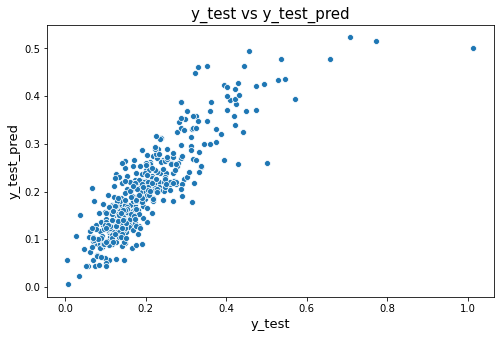

In [92]:
plt.figure(figsize=(8,5))
plt.title("y_test vs y_test_pred",size = 15)
sns.scatterplot(y_test,y_test_pred)
plt.xlabel("y_test",size = 13)
plt.ylabel("y_test_pred",size = 13)
plt.show()

### 2) Ridge Regression

In [93]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

In [94]:
# training data
X_train_ridge = X_train
print(X_train_ridge.shape)
X_train_ridge.head()

(1015, 546)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_19

In [95]:
y_train_ridge=y_train
print(y_train_ridge.shape)
y_train_ridge.head()

(1015,)


801     0.105619
569     0.142318
1181    0.503591
808     0.176102
1095    0.199313
Name: SalePrice, dtype: float64

In [96]:
# test data
X_test_ridge = X_test
print(X_test_ridge.shape)
X_test_ridge.head()

(436, 546)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_19

In [97]:
y_test_ridge = y_test
print(y_test_ridge.shape)
y_test_ridge.head()

(436,)


357    0.139558
824    0.278411
369    0.178989
291    0.142233
134    0.204337
Name: SalePrice, dtype: float64

In [98]:
# Building Ridge Regression with all the available variables

# Applying Ridge Regression with varying the hyperparameter 'lambda'

 # Higher the value of lambda, more the regularization.

# For params we got best alpha as 20
params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 
 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900,1000]}

# For params we got best alpha as 19
params1 = {'alpha': [15,16,18,19,20,21,22,23,24,25,30]}

# For params we got best alpha as 18.8
params2 = {'alpha': [18.5,18.6,18.7,18.8,18.9,19,19.1,19.2,19.3,19.4,19.5]}


# best params from each loop
best_params = []

for i in [params,params1,params2]:

    ridge = Ridge()

    # cross validation
    folds = 5
    model_cv = GridSearchCV(estimator = ridge, 
                            param_grid = i, 
                            scoring= 'neg_mean_absolute_error',  
                            cv = folds, 
                            return_train_score=True,
                            verbose = 1)

    model_cv.fit(X_train_ridge, y_train_ridge)

    print(model_cv.best_params_)
    # results for all the fits
    cv_results = pd.DataFrame(model_cv.cv_results_)
    cv_results = cv_results[["param_alpha","params","mean_train_score","mean_test_score"]]
    best_params.append(cv_results[cv_results.param_alpha == model_cv.best_params_["alpha"]])

Fitting 5 folds for each of 41 candidates, totalling 205 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 205 out of 205 | elapsed:   17.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


{'alpha': 20}
Fitting 5 folds for each of 11 candidates, totalling 55 fits


[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


{'alpha': 19}
Fitting 5 folds for each of 11 candidates, totalling 55 fits
{'alpha': 18.8}


[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed:    4.2s finished


- Below are the best aplha values.
- Here we observe that for the three aplha values we see that there is no significant change in "mean_train_score" and "mean_test_score".
- Hence for Ridge Regression we can consider 20 as optimal aplha value. 

In [99]:
best_params_data = pd.concat(best_params)
print("\n Best alpha and mean_score for each set of params('hyperparameters')")
best_params_data


 Best alpha and mean_score for each set of params('hyperparameters')


,param_alpha,params,mean_train_score,mean_test_score
23,20,{'alpha': 20},-0.023253,-0.029496
3,19,{'alpha': 19},-0.023128,-0.029495
3,18.8,{'alpha': 18.8},-0.023102,-0.029495


In [100]:
# Calculating R2 square for the best alpha values obtained from GridSearch CV
# Here we observe the similar trend and see 20 as our optimal alpha value as we donot see any significance change in R2 scores
# for different aplha values.

def R2_ridge(X_train,X_test,y_train,y_test,params):

    R2_test = []
    R2_train = []
    alpha = []
    
    for i in params:
        
        alpha.append(i)
        
        # Performing ridge regression
        ridge = Ridge(alpha=i)
        ridge.fit(X_train, y_train)
        
        # Predicting y_pred for train data
        y_train_pred = ridge.predict(X_train)
        # Predicting y_pred for test dat
        y_test_pred = ridge.predict(X_test)
        
        # R2 Score for train data
        r2_train = round(r2_score(y_train, y_train_pred),2)
        R2_train.append(r2_train)
        
        #R2 Score for train data
        r2_test = round(r2_score(y_test, y_test_pred),2)
        R2_test.append(r2_test)
        
    R2data = pd.DataFrame({"alpha":alpha,"R2_train":R2_train,"R2_test":R2_test})
        
    return R2data

#best aplpha values
param_alpha = best_params_data.param_alpha.to_list()
param_alpha

# dataframe for best alpha values
R2_ridge(X_train_ridge,X_test_ridge,y_train_ridge,y_test_ridge,param_alpha)

,alpha,R2_train,R2_test
0,20.0,0.89,0.85
1,19.0,0.89,0.85
2,18.8,0.89,0.85


#### Ridge Regression for optimal aplha value

In [101]:
ridge = Ridge(alpha=20)
ridge = ridge.fit(X_train_ridge,y_train_ridge)

In [102]:
# Coefficient and Beta values for Ridge Regression optimal alpha value(20)
ridge_regression = pd.DataFrame()
ridge_regression["attributes"] = X_train_ridge.columns
ridge_regression["Beta_values"] = ridge.coef_
ridge_regression = ridge_regression.sort_values("Beta_values",ascending=False)
ridge_regression["Beta_values"] = ridge_regression["Beta_values"].apply(lambda x : round(x,5))
ridge_regression

,attributes,Beta_values
84,OverallQual_Excellent,0.03216
10,GrLivArea,0.03003
59,Neighborhood_NoRidge,0.02890
88,OverallQual_Very Excellent,0.02810
307,BsmtQual_Ex,0.02722
351,FullBath_Others,0.02642
494,GarageCars_3,0.02634
371,TotRmsAbvGrd_Others,0.02494
8,2ndFlrSF,0.02446
7,1stFlrSF,0.02432


### Residual Analysis
- lets check if the error terms are normally distributed (which is infact, one of the major assumptions of linear 'regression), let us plot the histogram of the error terms and see what it looks like.
- Also lets check for independence and equal variance.

- After Residual Analysis we can see that we have an ideal model with all the error terms "Normally Distributed" and with equal variance and independence when plotted againts y_ predicted values.

In [103]:
print(X_train_ridge.shape)
X_train_ridge.head()

(1015, 546)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_19

In [104]:
y_train_pred_ridge = ridge.predict(X_train_ridge)

In [105]:
err = y_train_ridge-y_train_pred_ridge

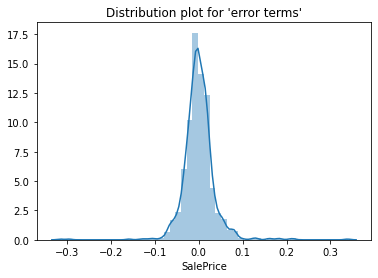

In [106]:
# plotting the error terms
# here can observe that all the error terms are normally distributed
plt.title("Distribution plot for 'error terms'")
sns.distplot(err)
plt.show()

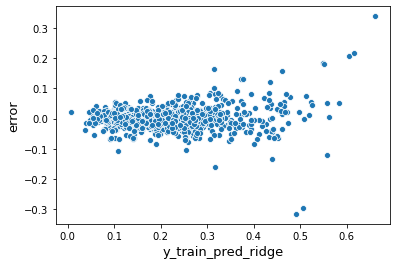

In [107]:
# plotting the error terms againts y_train_pred to check the independence and equal variance of error terms
sns.scatterplot(y_train_pred_ridge,err)
plt.xlabel("y_train_pred_ridge",size = 13)
plt.ylabel("error",size = 13)
plt.show()

### 3) Lasso Regression

In [108]:
from sklearn.linear_model import Lasso

In [109]:
# training data
X_train_lasso = X_train
print(X_train_lasso.shape)
X_train_lasso.head()

(1015, 546)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_19

In [110]:
y_train_lasso = y_train
print(y_train_lasso.shape)
y_train_lasso.head()

(1015,)


801     0.105619
569     0.142318
1181    0.503591
808     0.176102
1095    0.199313
Name: SalePrice, dtype: float64

In [111]:
# test data
X_test_lasso = X_test
print(X_test_lasso.shape)
X_test_lasso.head()

(436, 546)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_19

In [112]:
y_test_lasso = y_test
print(y_test_lasso.shape)
y_test_lasso.head()

(436,)


357    0.139558
824    0.278411
369    0.178989
291    0.142233
134    0.204337
Name: SalePrice, dtype: float64

In [113]:
# Building lasso Regression with all the available variables

# Applying lasso Regression with varying the hyperparameter 'lambda'

 # Higher the value of lambda, more the regularization.

params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900,1000]}

params1 = {'alpha': [0.00005,0.00006,0.00007,0.00008,0.00009,0.0001,0.0002,0.0003,0.0004,0.0005]}

params2 = {'alpha': [0.0015,0.0016,0.0017,0.0018,0.0019,0.0002,0.00021,0.00022,0.00023,0.00024,0.00025]}

params3 = {'alpha': [0.000215,0.000216,0.000217,0.000218,0.000219,0.00022,0.000221,0.000222,0.000223,0.000224,0.000225]}

# best params from each loop
best_params = []

for i in [params,params1,params2,params3]:

    lasso = Lasso()

    # cross validation
    folds = 5
    model_cv = GridSearchCV(estimator = lasso, 
                            param_grid = i, 
                            scoring= 'neg_mean_absolute_error',  
                            cv = folds, 
                            return_train_score=True,
                            verbose = 1)

    model_cv.fit(X_train_lasso, y_train_lasso)

    print(model_cv.best_params_)
    
    # results for all the fits
    cv_results = pd.DataFrame(model_cv.cv_results_)
    cv_results = cv_results[["param_alpha","params","mean_train_score","mean_test_score"]]
    best_params.append(cv_results[cv_results.param_alpha == model_cv.best_params_["alpha"]])

Fitting 5 folds for each of 41 candidates, totalling 205 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 205 out of 205 | elapsed:   10.7s finished


{'alpha': 0.0001}
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    9.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


{'alpha': 0.0002}
Fitting 5 folds for each of 11 candidates, totalling 55 fits


[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed:    5.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


{'alpha': 0.00022}
Fitting 5 folds for each of 11 candidates, totalling 55 fits
{'alpha': 0.000219}


[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed:    5.6s finished


- Below are the best aplha values.
- Here we observe that for the three aplha values we see that there is no significant change in "mean_train_score" and "mean_test_score".
- Hence for Lasso Regression we can consider 0.0002 as optimal aplha value.

In [114]:
best_params_data = pd.concat(best_params)
print("\n Best alpha and mean_score for each set of params('hyperparameters')")
best_params_data


 Best alpha and mean_score for each set of params('hyperparameters')


,param_alpha,params,mean_train_score,mean_test_score
0,0.0001,{'alpha': 0.0001},-0.019742,-0.027238
6,0.0002,{'alpha': 0.0002},-0.021350,-0.026567
7,0.00022,{'alpha': 0.00022},-0.021591,-0.026566
4,0.000219,{'alpha': 0.000219},-0.021579,-0.026566


In [115]:
# Calculating R2 square for the best alpha values obtained from GridSearch CV
# Here we observe the similar trend and see 0.0002 as our optimal alpha value as we donot see any significance change in R2 scores
# for different aplha values.

def R2_lasso(X_train,X_test,y_train,y_test,params):

    R2_test = []
    R2_train = []
    alpha = []
    
    for i in params:
        
        alpha.append(i)
        
        # Performing ridge regression
        lasso = Lasso(alpha=i)
        lasso.fit(X_train, y_train)
        
        # Predicting y_pred for train data
        y_train_pred = lasso.predict(X_train)
        # Predicting y_pred for test dat
        y_test_pred = lasso.predict(X_test)
        
        # R2 Score for train data
        r2_train = round(r2_score(y_train, y_train_pred),2)
        R2_train.append(r2_train)
        
        #R2 Score for train data
        r2_test = round(r2_score(y_test, y_test_pred),2)
        R2_test.append(r2_test)
        
    R2data = pd.DataFrame({"alpha":alpha,"R2_train":R2_train,"R2_test":R2_test})
        
    return R2data

#best aplpha values
param_alpha = best_params_data.param_alpha.to_list()
param_alpha

# dataframe for best alpha values
R2_lasso(X_train_lasso,X_test_lasso,y_train_lasso,y_test_lasso,param_alpha)       

,alpha,R2_train,R2_test
0,0.000100,0.91,0.86
1,0.000200,0.90,0.87
2,0.000220,0.90,0.87
3,0.000219,0.90,0.87


#### Lasso Regression for optimal aplha value

In [116]:
lasso = Lasso(alpha=0.0002)
lasso = lasso.fit(X_train_lasso,y_train_lasso)

In [117]:
# Coefficient and Beta values for Lasso Regression optimal alpha value(0.0002)
lasso_regression = pd.DataFrame()
lasso_regression["attributes"] = X_train_lasso.columns
lasso_regression["Beta_values"] = lasso.coef_
lasso_regression = lasso_regression.sort_values("Beta_values",ascending=False)
lasso_regression["Beta_values"] = lasso_regression["Beta_values"].apply(lambda x : round(x,5))
lasso_regression

,attributes,Beta_values
10,GrLivArea,0.25566
84,OverallQual_Excellent,0.08346
88,OverallQual_Very Excellent,0.08064
511,PoolQC_Ex,0.05783
59,Neighborhood_NoRidge,0.04626
89,OverallQual_Very Good,0.03497
60,Neighborhood_NridgHt,0.03406
307,BsmtQual_Ex,0.03205
494,GarageCars_3,0.03146
318,BsmtExposure_Gd,0.03031


### Residual Analysis
- lets check if the error terms are normally distributed (which is infact, one of the major assumptions of linear 'regression), let us plot the histogram of the error terms and see what it looks like.
- Also lets check for independence and equal variance.

- After Residual Analysis we can see that we have an ideal model with all the error terms "Normally Distributed" and with equal variance and independence when plotted againts y_ predicted values.

In [118]:
print(X_train_lasso.shape)
X_train_lasso.head()

(1015, 546)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_19

In [119]:
y_train_pred_lasso = lasso.predict(X_train_lasso)

In [120]:
err = y_train_lasso-y_train_pred_lasso

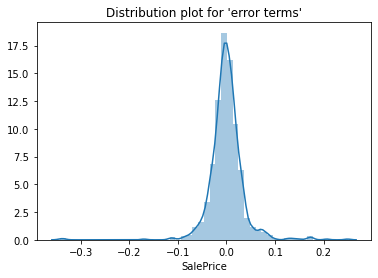

In [121]:
# plotting the error terms
# here can observe that all the error terms are normally distributed
plt.title("Distribution plot for 'error terms'")
sns.distplot(err)
plt.show()

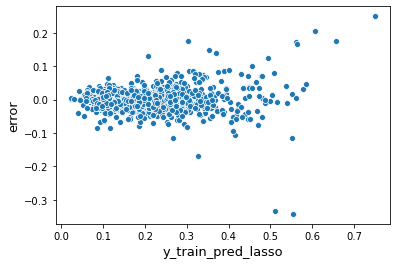

In [122]:
# plotting the error terms againts y_train_pred to check the independence and equal variance of error terms
sns.scatterplot(y_train_pred_lasso,err)
plt.xlabel("y_train_pred_lasso",size = 13)
plt.ylabel("error",size = 13)
plt.show()

### Model Conclusion

- 1) Here after performing both Ridge and Lasso Regression we have obtained optimal aplha as 20 for Ridge and 0.0002 for Lasso.
- 2) We have also calculated R2 score for both Train and Test data for both the regression models(Ridge and Lasso) and have seen that the difference is almost similar in both the cases.
- 3) Here as the difference in R2 score for both the model is same, we can choose Lasso as our final model as the number of predictor variables are very less in Lasso compared to Ridge.

### Subjective Questions

- Question 1

- What is the optimal value of alpha for ridge and lasso regression? What will be the changes in the model if you choose double the value of alpha for both ridge and lasso? What will be the most important predictor variables after the change is implemented?

#### Ridge Regression
#### Before doubling the value of alpha

In [123]:
ridge = Ridge(alpha=20)
ridge = ridge.fit(X_train_ridge,y_train_ridge)

In [124]:
# Coefficient and Beta values for Ridge Regression optimal alpha value(20)
ridge_regression = pd.DataFrame()
ridge_regression["attributes"] = X_train_ridge.columns
ridge_regression["Beta_values"] = ridge.coef_
ridge_regression = ridge_regression.sort_values("Beta_values",ascending=False)
ridge_regression["Beta_values"] = ridge_regression["Beta_values"].apply(lambda x : round(x,5))
ridge_regression

,attributes,Beta_values
84,OverallQual_Excellent,0.03216
10,GrLivArea,0.03003
59,Neighborhood_NoRidge,0.02890
88,OverallQual_Very Excellent,0.02810
307,BsmtQual_Ex,0.02722
351,FullBath_Others,0.02642
494,GarageCars_3,0.02634
371,TotRmsAbvGrd_Others,0.02494
8,2ndFlrSF,0.02446
7,1stFlrSF,0.02432


In [125]:
R2_ridge(X_train_ridge, X_test_ridge, y_train_ridge, y_test_ridge, [20])

,alpha,R2_train,R2_test
0,20,0.89,0.85


#### After doubling the value of alpha

In [126]:
ridge = Ridge(alpha=40)
ridge = ridge.fit(X_train_ridge,y_train_ridge)

In [127]:
# Coefficient and Beta values for Ridge Regression optimal alpha value(20)
ridge_regression = pd.DataFrame()
ridge_regression["attributes"] = X_train_ridge.columns
ridge_regression["Beta_values"] = ridge.coef_
ridge_regression = ridge_regression.sort_values("Beta_values",ascending=False)
ridge_regression["Beta_values"] = ridge_regression["Beta_values"].apply(lambda x : round(x,5))
ridge_regression

,attributes,Beta_values
494,GarageCars_3,0.02635
307,BsmtQual_Ex,0.02562
84,OverallQual_Excellent,0.02376
371,TotRmsAbvGrd_Others,0.02226
351,FullBath_Others,0.02210
361,KitchenQual_Ex,0.02195
10,GrLivArea,0.02179
59,Neighborhood_NoRidge,0.02175
376,Fireplaces_2,0.02045
88,OverallQual_Very Excellent,0.02029


In [128]:
R2_ridge(X_train_ridge, X_test_ridge, y_train_ridge, y_test_ridge, [40])

,alpha,R2_train,R2_test
0,40,0.87,0.84


#### Lasso Regression
#### Before doubling the value of alpha

In [129]:
lasso = Lasso(alpha=0.0002)
lasso = lasso.fit(X_train_lasso,y_train_lasso)

In [130]:
# Coefficient and Beta values for Lasso Regression optimal alpha value(0.0002)
lasso_regression = pd.DataFrame()
lasso_regression["attributes"] = X_train_lasso.columns
lasso_regression["Beta_values"] = lasso.coef_
lasso_regression = lasso_regression.sort_values("Beta_values",ascending=False)
lasso_regression["Beta_values"] = lasso_regression["Beta_values"].apply(lambda x : round(x,5))
lasso_regression

,attributes,Beta_values
10,GrLivArea,0.25566
84,OverallQual_Excellent,0.08346
88,OverallQual_Very Excellent,0.08064
511,PoolQC_Ex,0.05783
59,Neighborhood_NoRidge,0.04626
89,OverallQual_Very Good,0.03497
60,Neighborhood_NridgHt,0.03406
307,BsmtQual_Ex,0.03205
494,GarageCars_3,0.03146
318,BsmtExposure_Gd,0.03031


In [131]:
R2_lasso(X_train_ridge, X_test_ridge, y_train_ridge, y_test_ridge, [0.0002])

,alpha,R2_train,R2_test
0,0.0002,0.9,0.87


#### After doubling the value of alpha

In [132]:
lasso = Lasso(alpha=0.0004)
lasso = lasso.fit(X_train_lasso,y_train_lasso)

In [133]:
# Coefficient and Beta values for Lasso Regression optimal alpha value(0.0002)
lasso_regression = pd.DataFrame()
lasso_regression["attributes"] = X_train_lasso.columns
lasso_regression["Beta_values"] = lasso.coef_
lasso_regression = lasso_regression.sort_values("Beta_values",ascending=False)
lasso_regression["Beta_values"] = lasso_regression["Beta_values"].apply(lambda x : round(x,5))
lasso_regression

,attributes,Beta_values
10,GrLivArea,0.21316
84,OverallQual_Excellent,0.07153
88,OverallQual_Very Excellent,0.06632
59,Neighborhood_NoRidge,0.04369
494,GarageCars_3,0.03579
307,BsmtQual_Ex,0.03407
89,OverallQual_Very Good,0.03238
60,Neighborhood_NridgHt,0.02977
376,Fireplaces_2,0.02922
351,FullBath_Others,0.02886


In [134]:
R2_lasso(X_train_ridge, X_test_ridge, y_train_ridge, y_test_ridge, [0.0004])

,alpha,R2_train,R2_test
0,0.0004,0.88,0.86


- Question 3

- After building the model, you realised that the five most important predictor variables in the lasso model are not available in the incoming data. You will now have to create another model excluding the five most important predictor variables. Which are the five most important predictor variables now?

In [135]:
lasso = Lasso(alpha=0.0002)
lasso = lasso.fit(X_train_lasso,y_train_lasso)

In [136]:
# Coefficient and Beta values for Lasso Regression optimal alpha value(0.0002)
lasso_regression = pd.DataFrame()
lasso_regression["attributes"] = X_train_lasso.columns
lasso_regression["Beta_values"] = lasso.coef_
lasso_regression = lasso_regression.sort_values("Beta_values",ascending=False)
lasso_regression["Beta_values"] = lasso_regression["Beta_values"].apply(lambda x : round(x,5))
lasso_regression[lasso_regression.Beta_values != 0]

,attributes,Beta_values
10,GrLivArea,0.25566
84,OverallQual_Excellent,0.08346
88,OverallQual_Very Excellent,0.08064
511,PoolQC_Ex,0.05783
59,Neighborhood_NoRidge,0.04626
89,OverallQual_Very Good,0.03497
60,Neighborhood_NridgHt,0.03406
307,BsmtQual_Ex,0.03205
494,GarageCars_3,0.03146
318,BsmtExposure_Gd,0.03031


In [137]:
# Top 5 predictor variables for lasso regression
lasso_regression[lasso_regression.attributes.isin(["GrLivArea","OverallQual_Excellent","OverallQual_Very Excellent","PoolQC_Ex","PoolQC_Gd"])]

,attributes,Beta_values
10,GrLivArea,0.25566
84,OverallQual_Excellent,0.08346
88,OverallQual_Very Excellent,0.08064
511,PoolQC_Ex,0.05783
513,PoolQC_Gd,-0.06486


#### Builing Lasso Regression Model Excluding the five most important predictor variables.

In [138]:
X_train_lasso.head()

,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Excellent,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_19

In [139]:
# Eliminating the top 5 predictor and preparing the data set.
X_train_lasso_modelX = X_train_lasso.drop(["GrLivArea","OverallQual_Excellent","OverallQual_Very Excellent","PoolQC_Ex","PoolQC_Gd"],1)
print(X_train_lasso_modelX.shape)
X_train_lasso_modelX.head()

(1015, 541)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_1976,YearRemodAdd_1977,YearRemodAdd_1978,YearRemodAdd_1979,Ye

In [140]:
X_test_lasso_modelX = X_test_lasso.drop(["GrLivArea","OverallQual_Excellent","OverallQual_Very Excellent","PoolQC_Ex","PoolQC_Gd"],1)
print(X_test_lasso_modelX.shape)
X_test_lasso_modelX.head()

(436, 541)


,LotFrontage,LotArea,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_Others,MSZoning_Others,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_No_alley_access,Alley_Others,LotShape_IR1,LotShape_Others,LotShape_Reg,LandContour_Lvl,LandContour_Others,Utilities_AllPub,Utilities_NoSeWa,LotConfig_Corner,LotConfig_CulDSac,LotConfig_Inside,LotConfig_Others,LandSlope_Gtl,LandSlope_Others,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_Others,Condition2_Norm,Condition2_Others,BldgType_1Fam,BldgType_Others,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_Others,OverallQual_Above Average,OverallQual_Average,OverallQual_Below Average,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very Good,OverallQual_Very Poor,OverallCond_Above Average,OverallCond_Average,OverallCond_Below Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very Good,OverallCond_Very Poor,YearBuilt_1872,YearBuilt_1875,YearBuilt_1880,YearBuilt_1882,YearBuilt_1885,YearBuilt_1890,YearBuilt_1892,YearBuilt_1893,YearBuilt_1898,YearBuilt_1900,YearBuilt_1904,YearBuilt_1905,YearBuilt_1906,YearBuilt_1908,YearBuilt_1910,YearBuilt_1911,YearBuilt_1912,YearBuilt_1913,YearBuilt_1914,YearBuilt_1915,YearBuilt_1916,YearBuilt_1917,YearBuilt_1918,YearBuilt_1919,YearBuilt_1920,YearBuilt_1921,YearBuilt_1922,YearBuilt_1923,YearBuilt_1924,YearBuilt_1925,YearBuilt_1926,YearBuilt_1927,YearBuilt_1928,YearBuilt_1929,YearBuilt_1930,YearBuilt_1931,YearBuilt_1932,YearBuilt_1934,YearBuilt_1935,YearBuilt_1936,YearBuilt_1937,YearBuilt_1938,YearBuilt_1939,YearBuilt_1940,YearBuilt_1941,YearBuilt_1942,YearBuilt_1945,YearBuilt_1946,YearBuilt_1947,YearBuilt_1948,YearBuilt_1949,YearBuilt_1950,YearBuilt_1951,YearBuilt_1952,YearBuilt_1953,YearBuilt_1954,YearBuilt_1955,YearBuilt_1956,YearBuilt_1957,YearBuilt_1958,YearBuilt_1959,YearBuilt_1960,YearBuilt_1961,YearBuilt_1962,YearBuilt_1963,YearBuilt_1964,YearBuilt_1965,YearBuilt_1966,YearBuilt_1967,YearBuilt_1968,YearBuilt_1969,YearBuilt_1970,YearBuilt_1971,YearBuilt_1972,YearBuilt_1973,YearBuilt_1974,YearBuilt_1975,YearBuilt_1976,YearBuilt_1977,YearBuilt_1978,YearBuilt_1979,YearBuilt_1980,YearBuilt_1981,YearBuilt_1982,YearBuilt_1983,YearBuilt_1984,YearBuilt_1985,YearBuilt_1986,YearBuilt_1987,YearBuilt_1988,YearBuilt_1989,YearBuilt_1990,YearBuilt_1991,YearBuilt_1992,YearBuilt_1993,YearBuilt_1994,YearBuilt_1995,YearBuilt_1996,YearBuilt_1997,YearBuilt_1998,YearBuilt_1999,YearBuilt_2000,YearBuilt_2001,YearBuilt_2002,YearBuilt_2003,YearBuilt_2004,YearBuilt_2005,YearBuilt_2006,YearBuilt_2007,YearBuilt_2008,YearBuilt_2009,YearBuilt_2010,YearRemodAdd_1950,YearRemodAdd_1951,YearRemodAdd_1952,YearRemodAdd_1953,YearRemodAdd_1954,YearRemodAdd_1955,YearRemodAdd_1956,YearRemodAdd_1957,YearRemodAdd_1958,YearRemodAdd_1959,YearRemodAdd_1960,YearRemodAdd_1961,YearRemodAdd_1962,YearRemodAdd_1963,YearRemodAdd_1964,YearRemodAdd_1965,YearRemodAdd_1966,YearRemodAdd_1967,YearRemodAdd_1968,YearRemodAdd_1969,YearRemodAdd_1970,YearRemodAdd_1971,YearRemodAdd_1972,YearRemodAdd_1973,YearRemodAdd_1974,YearRemodAdd_1975,YearRemodAdd_1976,YearRemodAdd_1977,YearRemodAdd_1978,YearRemodAdd_1979,Ye

In [141]:
y_train_lasso_modelX = y_train_lasso
y_test_lasso_modelX = y_test_lasso

In [142]:
y_train_lasso_modelX.head()

801     0.105619
569     0.142318
1181    0.503591
808     0.176102
1095    0.199313
Name: SalePrice, dtype: float64

In [143]:
y_test_lasso_modelX.head()

357    0.139558
824    0.278411
369    0.178989
291    0.142233
134    0.204337
Name: SalePrice, dtype: float64

In [144]:
# Building lasso Regression with all the available variables

# Applying lasso Regression with varying the hyperparameter 'lambda'

 # Higher the value of lambda, more the regularization.

params = {'alpha': [0.0001, 0.001, 0.01, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 3.0, 
 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900,1000]}

params1 = {'alpha': [0.00005,0.00006,0.00007,0.00008,0.00009,0.0001,0.0002,0.0003,0.0004,0.0005]}

params2 = {'alpha': [0.0015,0.0016,0.0017,0.0018,0.0019,0.0002,0.00021,0.00022,0.00023,0.00024,0.00025]}

params3 = {'alpha': [0.000215,0.000216,0.000217,0.000218,0.000219,0.00022,0.000221,0.000222,0.000223,0.000224,0.000225]}

# best params from each loop
best_params = []

for i in [params,params1,params2,params3]:

    lasso = Lasso()

    # cross validation
    folds = 5
    model_cv = GridSearchCV(estimator = lasso, 
                            param_grid = i, 
                            scoring= 'neg_mean_absolute_error',  
                            cv = folds, 
                            return_train_score=True,
                            verbose = 1)

    model_cv.fit(X_train_lasso_modelX, y_train_lasso_modelX)

    print(model_cv.best_params_)
    
    # results for all the fits
    cv_results = pd.DataFrame(model_cv.cv_results_)
    cv_results = cv_results[["param_alpha","params","mean_train_score","mean_test_score"]]
    best_params.append(cv_results[cv_results.param_alpha == model_cv.best_params_["alpha"]])

Fitting 5 folds for each of 41 candidates, totalling 205 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 205 out of 205 | elapsed:   11.7s finished


{'alpha': 0.0001}
Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    6.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


{'alpha': 0.0002}
Fitting 5 folds for each of 11 candidates, totalling 55 fits


[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed:    5.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


{'alpha': 0.0002}
Fitting 5 folds for each of 11 candidates, totalling 55 fits
{'alpha': 0.000215}


[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed:    5.4s finished


- Below are the best aplha values.
- Here we observe that for the three aplha values we see that there is no significant change in "mean_train_score" and "mean_test_score".
- Hence for Lasso Regression we can consider 0.0002 as optimal aplha value.

In [145]:
best_params_data = pd.concat(best_params)
print("\n Best alpha and mean_score for each set of params('hyperparameters')")
best_params_data


 Best alpha and mean_score for each set of params('hyperparameters')


,param_alpha,params,mean_train_score,mean_test_score
0,0.0001,{'alpha': 0.0001},-0.020759,-0.028529
6,0.0002,{'alpha': 0.0002},-0.022294,-0.027821
5,0.0002,{'alpha': 0.0002},-0.022294,-0.027821
0,0.000215,{'alpha': 0.000215},-0.022467,-0.027822


In [146]:
# Calculating R2 square for the best alpha values obtained from GridSearch CV
# Here we observe the similar trend and see 0.0002 as our optimal alpha value as we donot see any significance change in R2 scores
# for different aplha values.

def R2_lasso(X_train,X_test,y_train,y_test,params):

    R2_test = []
    R2_train = []
    alpha = []
    
    for i in params:
        
        alpha.append(i)
        
        # Performing ridge regression
        lasso = Lasso(alpha=i)
        lasso.fit(X_train, y_train)
        
        # Predicting y_pred for train data
        y_train_pred = lasso.predict(X_train)
        # Predicting y_pred for test dat
        y_test_pred = lasso.predict(X_test)
        
        # R2 Score for train data
        r2_train = round(r2_score(y_train, y_train_pred),2)
        R2_train.append(r2_train)
        
        #R2 Score for train data
        r2_test = round(r2_score(y_test, y_test_pred),2)
        R2_test.append(r2_test)
        
    R2data = pd.DataFrame({"alpha":alpha,"R2_train":R2_train,"R2_test":R2_test})
        
    return R2data

#best aplpha values
param_alpha = best_params_data.param_alpha.to_list()
param_alpha

# dataframe for best alpha values
R2_lasso(X_train_lasso_modelX,X_test_lasso_modelX,y_train_lasso_modelX,y_test_lasso_modelX,param_alpha)       

,alpha,R2_train,R2_test
0,0.000100,0.90,0.86
1,0.000200,0.89,0.87
2,0.000200,0.89,0.87
3,0.000215,0.89,0.87


In [147]:
lasso = Lasso(alpha=0.0002)
lasso = lasso.fit(X_train_lasso_modelX,y_train_lasso_modelX)

In [148]:
# Coefficient and Beta values for Lasso Regression optimal alpha value(0.0002)
lasso_regression = pd.DataFrame()
lasso_regression["attributes"] = X_train_lasso_modelX.columns
lasso_regression["Beta_values"] = lasso.coef_
lasso_regression = lasso_regression.sort_values("Beta_values",ascending=False)
lasso_regression["Beta_values"] = lasso_regression["Beta_values"].apply(lambda x : round(x,5))
lasso_regression[lasso_regression.Beta_values != 0]

,attributes,Beta_values
7,1stFlrSF,0.22039
8,2ndFlrSF,0.09232
58,Neighborhood_NoRidge,0.04930
304,BsmtQual_Ex,0.04227
59,Neighborhood_NridgHt,0.04007
65,Neighborhood_StoneBr,0.03728
491,GarageCars_3,0.03557
358,KitchenQual_Ex,0.03485
348,FullBath_Others,0.03434
315,BsmtExposure_Gd,0.03083


In [149]:
# Top 5 predictors after excluding the five most important predictor variables of the 1st model.
lasso_regression[lasso_regression.attributes.isin(["1stFlrSF","2ndFlrSF","Neighborhood_NoRidge","BsmtQual_Ex","Neighborhood_NridgHt"])]

,attributes,Beta_values
7,1stFlrSF,0.22039
8,2ndFlrSF,0.09232
58,Neighborhood_NoRidge,0.04930
304,BsmtQual_Ex,0.04227
59,Neighborhood_NridgHt,0.04007
